In [1]:
%load_ext pycodestyle_magic

In [2]:
%flake8_on

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from functions import *
from pandas_profiling import ProfileReport
import timeit
from datetime import datetime

import folium
from textdistance import levenshtein
from sklearn.preprocessing import StandardScaler, MinMaxScaler

5:1: F403 'from functions import *' used; unable to detect undefined names


# Fonctions

In [4]:
def suppression_lignes(df, masque):
    """
    suppression des lignes d'un df à partir d'un masque

    retourne : df_cleaned = df où les lignes ont été enlevées
    """
    print('suppression de {} lignes, '
          'soit {:.2f}% des entrées.'.format(len(df[masque]),
                                             100*len(df[masque])/len(df)))
    df_cleaned = df.drop(df[masque].index)
    print('dimension initiale :', df.shape)
    print('dimension finale :', df_cleaned.shape)
    return df_cleaned

# Import des données

In [5]:
start_time_ALL = timeit.default_timer()

In [6]:
customers = pd.read_csv('../01_DATA/olist_customers_dataset.csv')
geolocation = pd.read_csv('../01_DATA/olist_geolocation_dataset.csv')
order_items = pd.read_csv('../01_DATA/olist_order_items_dataset.csv', parse_dates=True)
order_payment = pd.read_csv('../01_DATA/olist_order_payments_dataset.csv')
order_reviews = pd.read_csv('../01_DATA/olist_order_reviews_dataset.csv', parse_dates=True)
orders = pd.read_csv('../01_DATA/olist_orders_dataset.csv', parse_dates=True)
products = pd.read_csv('../01_DATA/olist_products_dataset.csv')
sellers = pd.read_csv('../01_DATA/olist_sellers_dataset.csv')
translation = pd.read_csv('../01_DATA/product_category_name_translation.csv')

3:80: E501 line too long (87 > 79 characters)
5:80: E501 line too long (91 > 79 characters)


In [7]:
# transformation des colonnes temporelles en datetime
order_items['shipping_limit_date'] = pd.to_datetime(order_items['shipping_limit_date'])

order_reviews['review_creation_date'] = pd.to_datetime(order_reviews['review_creation_date'])
order_reviews['review_answer_timestamp'] = pd.to_datetime(order_reviews['review_answer_timestamp'])

orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])
orders['order_approved_at'] = pd.to_datetime(orders['order_approved_at'])
orders['order_delivered_carrier_date'] = pd.to_datetime(orders['order_delivered_carrier_date'])
orders['order_delivered_customer_date'] = pd.to_datetime(orders['order_delivered_customer_date'])
orders['order_estimated_delivery_date'] = pd.to_datetime(orders['order_estimated_delivery_date'])

2:80: E501 line too long (87 > 79 characters)
4:80: E501 line too long (93 > 79 characters)
5:80: E501 line too long (99 > 79 characters)
7:80: E501 line too long (87 > 79 characters)
9:80: E501 line too long (95 > 79 characters)
10:80: E501 line too long (97 > 79 characters)
11:80: E501 line too long (97 > 79 characters)


In [8]:
liste_fichiers = [customers, geolocation, order_items,
                  order_payment, order_reviews, orders,
                  products, sellers, translation]
liste_noms_fichiers = ['customers', 'geolocation', 'order_items',
                       'order_payment', 'order_reviews', 'orders',
                       'products', 'sellers', 'translation']

# info générales

In [9]:
# attribution nom à chaque fichier pour pouvoir les parcours ensuite
for nom, file in zip(liste_noms_fichiers, liste_fichiers):
    file.name = nom

In [10]:
for file in liste_fichiers:
    print(file.name, file.shape)

customers (99441, 5)
geolocation (1000163, 5)
order_items (112650, 7)
order_payment (103886, 5)
order_reviews (99224, 7)
orders (99441, 8)
products (32951, 9)
sellers (3095, 4)
translation (71, 2)


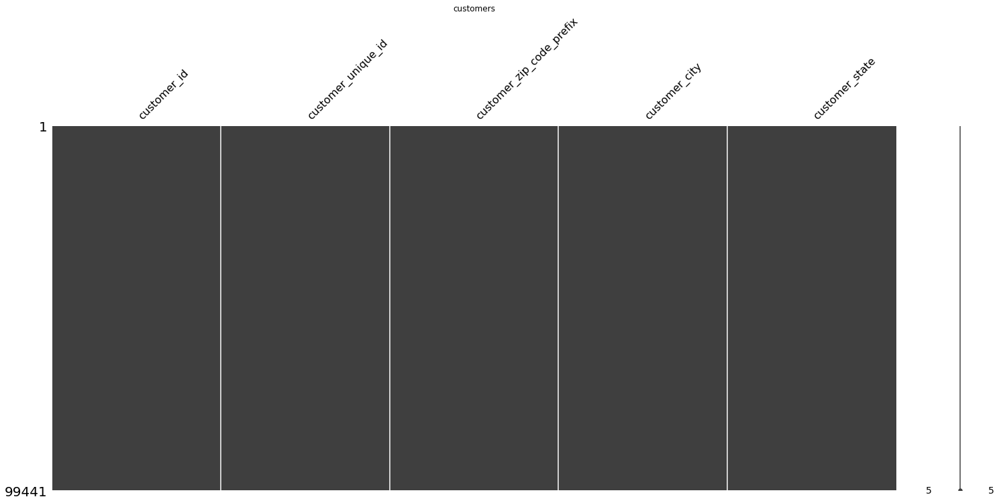

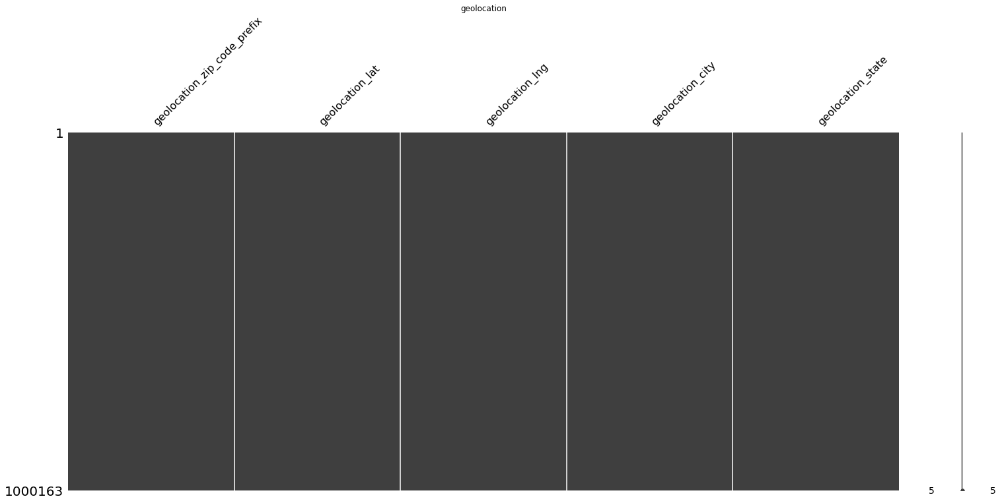

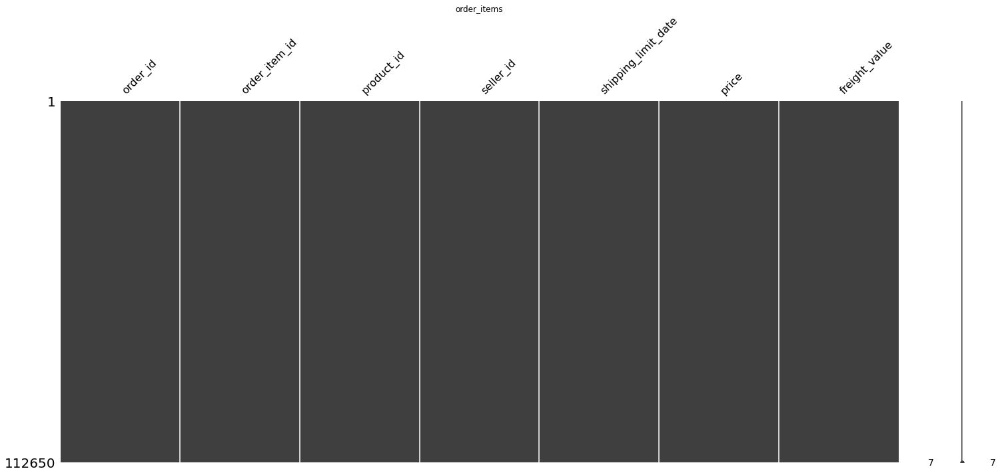

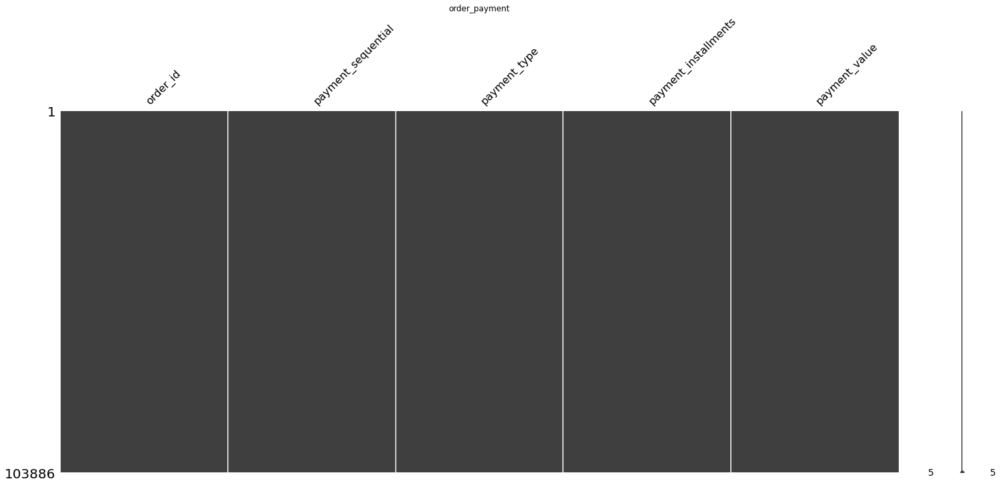

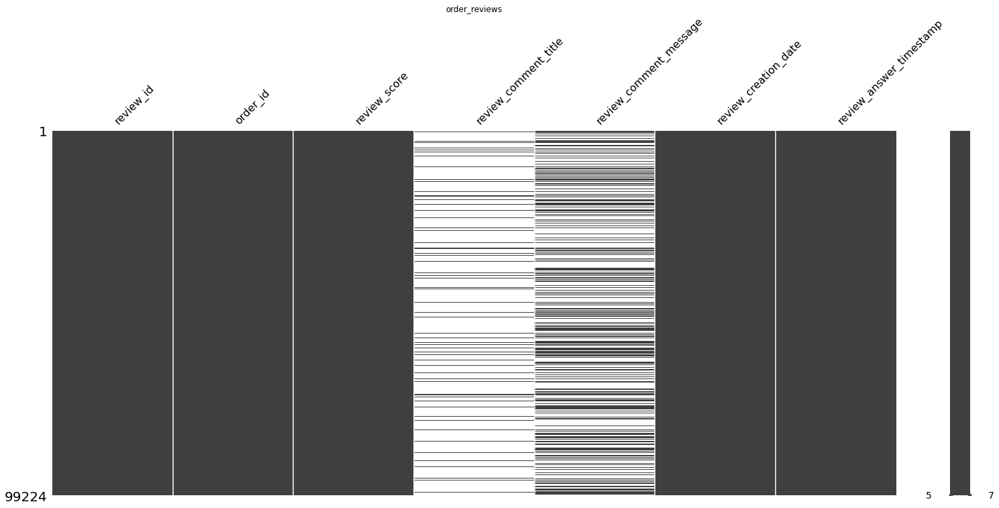

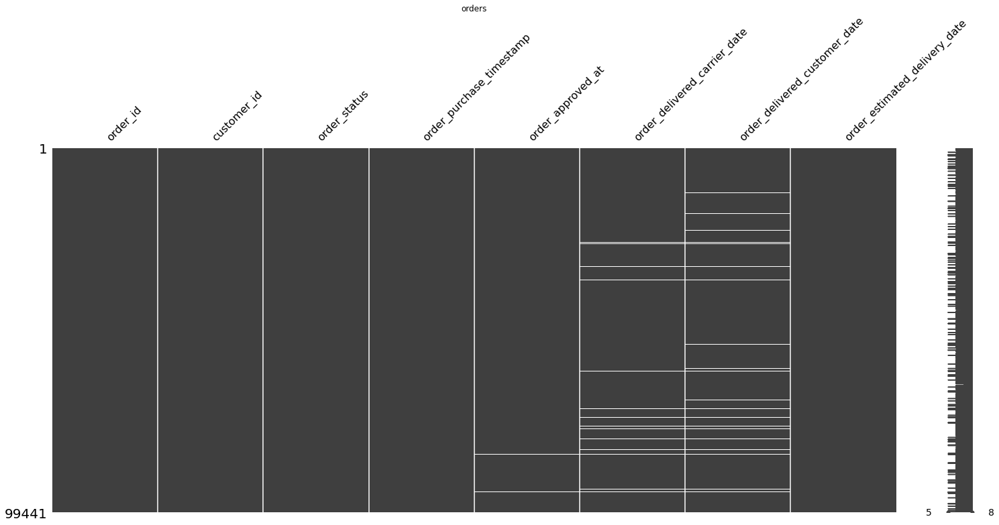

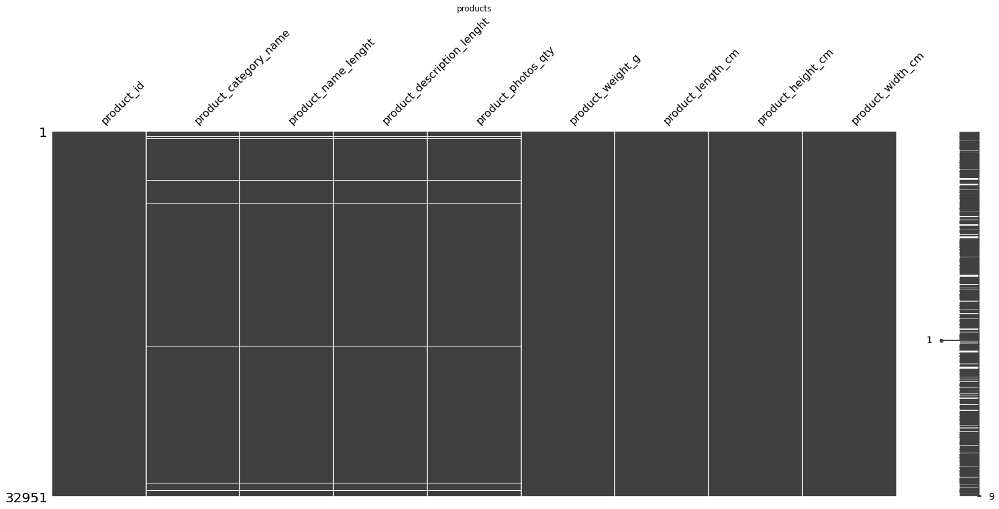

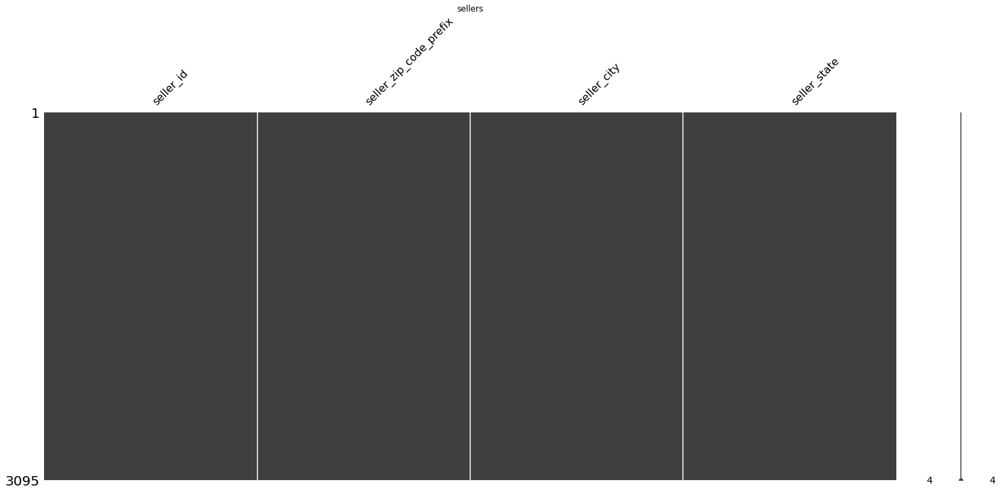

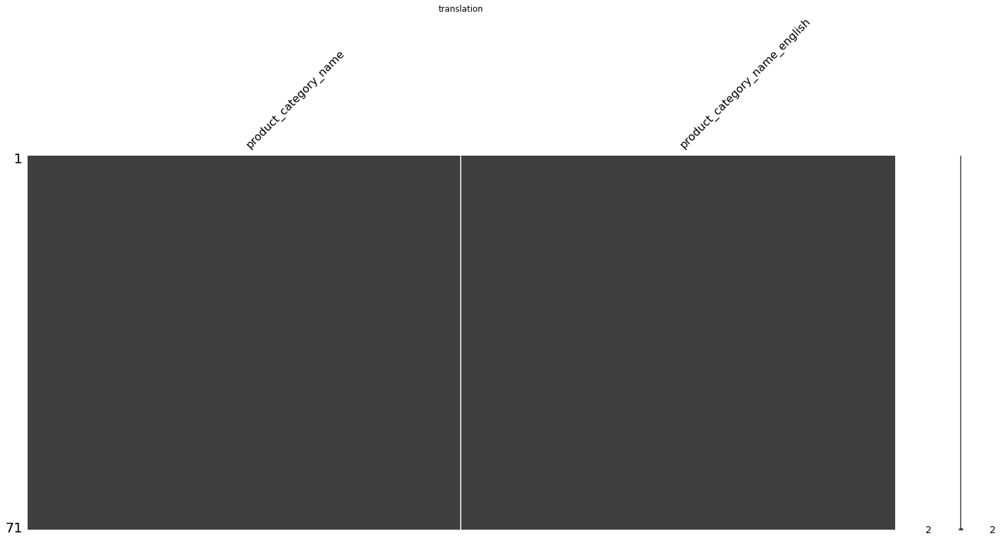

1: E999 SyntaxError: invalid syntax
5:25: E703 statement ends with a semicolon


In [11]:
import missingno as msno
%matplotlib inline
for file in liste_fichiers:
    msno.matrix(file)
    plt.title(file.name);

In [12]:
for file in liste_fichiers:
    print('-'*40)
    print(file.name)
    print('-'*40)
    pourcent_NA_df(file)
    file.info()

----------------------------------------
customers
----------------------------------------
Il y a 100.00% valeurs renseignées (soit 0.00 % de valeurs manquantes) dans l'intégralité du df
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB
----------------------------------------
geolocation
----------------------------------------
Il y a 100.00% valeurs renseignées (soit 0.00 % de valeurs manquantes) dans l'intégralité du df
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data c

Il y a des valeurs manquantes dans les tables :
- orders_reviews : 21% => correspond aux colonnes review_comment_title et review_comment_message moins bien renseignées
- orders : 0.6% => corresponds aux colonnes order_approved_at, order_delivered_carrier_date et order_delivered_customer_date
- products : 0.8% => correspond aux colonnes product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm

In [13]:
# regroupement des données dans un seul fichier
data_all = orders.merge(order_reviews, on='order_id')
data_all = data_all.merge(order_items, on='order_id')
data_all = data_all.merge(order_payment, on='order_id')
data_all = data_all.merge(products, on='product_id')
data_all = data_all.merge(customers, on='customer_id')
data_all = data_all.merge(sellers, on='seller_id')
# attribution des coordonnées moyennes par zipcode
# data_all = data_all.merge(geolocation,
#                           left_on='customer_zip_code_prefix',
#                           right_on='geolocation_zip_code_prefix',
#                           suffixes=(None, '_customer'))
# data_all = data_all.merge(geolocation,
#                           left_on='seller_zip_code_prefix',
#                           right_on='geolocation_zip_code_prefix',
#                           suffixes=(None, '_seller'))
# data_all = data_all.dropna(axis=0).reset_index(drop=True)
data_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117329 entries, 0 to 117328
Data columns (total 39 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       117329 non-null  object        
 1   customer_id                    117329 non-null  object        
 2   order_status                   117329 non-null  object        
 3   order_purchase_timestamp       117329 non-null  datetime64[ns]
 4   order_approved_at              117314 non-null  datetime64[ns]
 5   order_delivered_carrier_date   116094 non-null  datetime64[ns]
 6   order_delivered_customer_date  114858 non-null  datetime64[ns]
 7   order_estimated_delivery_date  117329 non-null  datetime64[ns]
 8   review_id                      117329 non-null  object        
 9   review_score                   117329 non-null  int64         
 10  review_comment_title           13892 non-null   object        
 11  

In [14]:
pourcent_NA_df(data_all)

Il y a 96.03% valeurs renseignées (soit 3.97 % de valeurs manquantes) dans l'intégralité du df


In [15]:
duplicated = data_all.duplicated()
print('{:0d} lignes avec des doublons'.format(file[duplicated].shape[0]))

0 lignes avec des doublons


C:\Users\Helene\AppData\Local\Temp/ipykernel_35828/2578261185.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('{:0d} lignes avec des doublons'.format(file[duplicated].shape[0]))


## Gestion valeurs manquantes

- orders_reviews : suppression des colonnes comment, je garde uniquement les notes attribuées
- orders : suppression des lignes non renseignées
- products : suppression des lignes sans product_category_name

In [16]:
liste_colonnes_supp_tot = []
liste_colonnes_supp = ['review_comment_title', 'review_comment_message']

order_reviews_cleaned, liste_colonnes_supp_tot = suppression_colonnes(order_reviews,
                                                                      liste_colonnes_supp,
                                                                      liste_colonnes_supp_tot)
print(liste_colonnes_supp_tot)
order_reviews_cleaned.head(2)

['review_comment_title', 'review_comment_message']


,review_id,order_id,review_score,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,2018-03-10,2018-03-11 03:05:13


4:80: E501 line too long (84 > 79 characters)
5:80: E501 line too long (90 > 79 characters)
6:80: E501 line too long (94 > 79 characters)


In [17]:
orders_cleaned = orders.dropna(axis=0)
print('dimension initiale :', orders.shape)
print('dimension finale :', orders_cleaned.shape)

dimension initiale : (99441, 8)
dimension finale : (96461, 8)


In [18]:
masque = products['product_category_name'].isna()
products_cleaned = suppression_lignes(products, masque)

suppression de 610 lignes, soit 1.85% des entrées.
dimension initiale : (32951, 9)
dimension finale : (32341, 9)


## Gestion des doublons

In [19]:
# mise à jour des fichiers d'intérêt
liste_fichiers = [customers, geolocation, order_items,
                  order_payment, order_reviews_cleaned, orders_cleaned,
                  products_cleaned, sellers, translation]
liste_noms_fichiers = ['customers', 'geolocation', 'order_items',
                  'order_payment', 'order_reviews_cleaned', 'orders_cleaned',
                  'products_cleaned', 'sellers', 'translation']

# attribution nom à chaque fichier pour pouvoir les parcours ensuite
for nom, file in zip(liste_noms_fichiers, liste_fichiers):
    file.name = nom

6:19: E128 continuation line under-indented for visual indent
7:19: E128 continuation line under-indented for visual indent


In [20]:
for file in liste_fichiers:
    print('-'*40)
    print(file.name)
    duplicated = file.duplicated()
    print('{:0d} lignes avec des doublons'.format(file[duplicated].shape[0]))

----------------------------------------
customers
0 lignes avec des doublons
----------------------------------------
geolocation
261831 lignes avec des doublons
----------------------------------------
order_items
0 lignes avec des doublons
----------------------------------------
order_payment
0 lignes avec des doublons
----------------------------------------
order_reviews_cleaned
0 lignes avec des doublons
----------------------------------------
orders_cleaned
0 lignes avec des doublons
----------------------------------------
products_cleaned
0 lignes avec des doublons
----------------------------------------
sellers
0 lignes avec des doublons
----------------------------------------
translation
0 lignes avec des doublons


Seul le fichier geolocation a des doublons

==> suppression des lignes en doublon

In [21]:
masque = geolocation.duplicated()
geolocation_cleaned = suppression_lignes(geolocation, masque)

suppression de 261831 lignes, soit 26.18% des entrées.
dimension initiale : (1000163, 5)
dimension finale : (738332, 5)


In [22]:
# mise à jour des fichiers d'intérêt
liste_fichiers = [customers, geolocation_cleaned, order_items,
                  order_payment, order_reviews_cleaned, orders_cleaned,
                  products_cleaned, sellers, translation]
liste_noms_fichiers = ['customers', 'geolocation_cleaned', 'order_items',
                       'order_payment', 'order_reviews_cleaned',
                       'orders_cleaned', 'products_cleaned',
                       'sellers', 'translation']

# attribution nom à chaque fichier pour pouvoir les parcours ensuite
for nom, file in zip(liste_noms_fichiers, liste_fichiers):
    file.name = nom

# Products
## Traduction products

In [23]:
translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [24]:
products_cleaned.describe(include='all')

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341,32341,32341.000000,32341.000000,32341.000000,32340.000000,32340.000000,32340.000000,32340.000000
unique,32341,73,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,1e9e8ef04dbcff4541ed26657ea517e5,cama_mesa_banho,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,3029,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,48.476949,771.495285,2.188986,2276.956586,30.854545,16.958813,23.208596
std,NaN,NaN,10.245741,635.115225,1.736766,4279.291845,16.955965,13.636115,12.078762
min,NaN,NaN,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,NaN,NaN,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,NaN,NaN,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,NaN,NaN,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000


In [25]:
avec_traduction = []
sans_traduction = []
for categorie in products_cleaned['product_category_name'].unique():
    if categorie in translation['product_category_name'].unique():
        avec_traduction.append(categorie)
    else:
        sans_traduction.append(categorie)

print('produits sans traduction:', sans_traduction)
print('nb produits avec traduction:', len(avec_traduction))

produits sans traduction: ['pc_gamer', 'portateis_cozinha_e_preparadores_de_alimentos']
nb produits avec traduction: 71


In [26]:
masque = products_cleaned['product_category_name'] == 'pc_gamer'
masque.sum()

3

In [27]:
masque = products_cleaned['product_category_name'] == 'portateis_cozinha_e_preparadores_de_alimentos'
masque.sum()

10

1:80: E501 line too long (101 > 79 characters)


Les produits sans traduction représentent 13 produits sur 32341

pc_gamer est relativement transparent. Par contre portateis_cozinha_e_preparadores_de_alimentos ne trouve pas de traduction evidente pour quelqu'un de non lusophone.

je conserve ces deux valeurs, en gardant en tête que je ne suis pas certaine de la signification de portateis_cozinha_e_preparadores_de_alimentos (peut être robot de cuisine ?)

In [28]:
for produit in products_cleaned['product_category_name'].unique():
    masque = products_cleaned['product_category_name'] == produit
    if produit in sans_traduction:
        products_cleaned.loc[masque, 'product_category_traduction'] = produit
    elif produit in avec_traduction:
        index_traduction = translation[translation['product_category_name'] == produit].index.values
        traduction = translation.loc[index_traduction[0], 'product_category_name_english']
        products_cleaned.loc[masque, 'product_category_traduction'] = traduction

6:80: E501 line too long (100 > 79 characters)
7:80: E501 line too long (90 > 79 characters)
8:80: E501 line too long (80 > 79 characters)


In [29]:
products_cleaned[['product_category_name', 'product_category_traduction']].describe(include='all')

,product_category_name,product_category_traduction
count,32341,32341
unique,73,73
top,cama_mesa_banho,bed_bath_table
freq,3029,3029


1:80: E501 line too long (98 > 79 characters)


## nettoyage

In [30]:
products_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32341 entries, 0 to 32950
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   product_id                   32341 non-null  object 
 1   product_category_name        32341 non-null  object 
 2   product_name_lenght          32341 non-null  float64
 3   product_description_lenght   32341 non-null  float64
 4   product_photos_qty           32341 non-null  float64
 5   product_weight_g             32340 non-null  float64
 6   product_length_cm            32340 non-null  float64
 7   product_height_cm            32340 non-null  float64
 8   product_width_cm             32340 non-null  float64
 9   product_category_traduction  32341 non-null  object 
dtypes: float64(7), object(3)
memory usage: 2.7+ MB


In [31]:
products_cleaned.describe(include='all')

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_traduction
count,32341,32341,32341.000000,32341.000000,32341.000000,32340.000000,32340.000000,32340.000000,32340.000000,32341
unique,32341,73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73
top,1e9e8ef04dbcff4541ed26657ea517e5,cama_mesa_banho,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bed_bath_table
freq,1,3029,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3029
mean,NaN,NaN,48.476949,771.495285,2.188986,2276.956586,30.854545,16.958813,23.208596,NaN
std,NaN,NaN,10.245741,635.115225,1.736766,4279.291845,16.955965,13.636115,12.078762,NaN
min,NaN,NaN,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,NaN
25%,NaN,NaN,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000,NaN
50%,NaN,NaN,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000,NaN
75%,NaN,NaN,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000,NaN


# Localisation

## Nettoyage

In [32]:
geolocation_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 738332 entries, 0 to 1000161
Data columns (total 5 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   geolocation_zip_code_prefix  738332 non-null  int64  
 1   geolocation_lat              738332 non-null  float64
 2   geolocation_lng              738332 non-null  float64
 3   geolocation_city             738332 non-null  object 
 4   geolocation_state            738332 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 33.8+ MB


### lat/long

Coordonnées min/max du Brésil :
- Latitude : min = -33.7422222 / max = 5.2722222 
- Longitude : min = -73.9922222 / max = 34.7916667 

Tout ce qui est en dehors de ces bornes est supprimé

In [33]:
masque_latitude_min = geolocation_cleaned['geolocation_lat'] < -33.7422222
masque_latitude_max = geolocation_cleaned['geolocation_lat'] > 5.2722222
masque_latitude = (masque_latitude_min | masque_latitude_max)

geolocation_cleaned = suppression_lignes(geolocation_cleaned, masque_latitude)

masque_longitude_min = geolocation_cleaned['geolocation_lng'] < -73.9922222
masque_longitude_max = geolocation_cleaned['geolocation_lng'] > 34.7916667
masque_longitude = (masque_longitude_min | masque_longitude_max)

geolocation_cleaned = suppression_lignes(geolocation_cleaned, masque_longitude)

suppression de 27 lignes, soit 0.00% des entrées.
dimension initiale : (738332, 5)
dimension finale : (738305, 5)
suppression de 0 lignes, soit 0.00% des entrées.
dimension initiale : (738305, 5)
dimension finale : (738305, 5)


### couple zipCode / city

#### Recherche des doublons sur les couples 'geolocation_zip_code_prefix' / 'geolocation_city'

In [34]:
# Dans les lignes qui ne sont pas des doublons, si il existe plusieurs occurrences d'un même zip_code
# c'est qu'il est attribué à des villes différentes ou que l'orthographe des villes n'est pas uniforme

# df des couples zipcode/city différents
masque = geolocation_cleaned.duplicated(subset=['geolocation_zip_code_prefix', 'geolocation_city'], keep=False)
geo_work = geolocation_cleaned[~masque]
print("il reste {} lignes avec des couples 'geolocation_zip_code_prefix' / 'geolocation_city' distincts".format(geo_work.shape[0]))
print("il y a {} valeurs différentes de 'geolocation_zip_code_prefix'".format(len(geo_work['geolocation_zip_code_prefix'].unique())))
print("il y a {} valeurs différentes de 'geolocation_city'".format(len(geo_work['geolocation_city'].unique())))

# Liste des zipcodes
zipcodes = geo_work['geolocation_zip_code_prefix'].unique()

1:80: E501 line too long (101 > 79 characters)
2:80: E501 line too long (102 > 79 characters)
5:80: E501 line too long (111 > 79 characters)
7:80: E501 line too long (131 > 79 characters)
8:80: E501 line too long (133 > 79 characters)
9:80: E501 line too long (111 > 79 characters)


il reste 2819 lignes avec des couples 'geolocation_zip_code_prefix' / 'geolocation_city' distincts
il y a 2631 valeurs différentes de 'geolocation_zip_code_prefix'
il y a 1516 valeurs différentes de 'geolocation_city'


Suppression des lignes correspondantes aux zipcodes problématiques

In [35]:
masque = geolocation_cleaned['geolocation_zip_code_prefix'].isin(list(zipcodes))
geolocation_cleaned = suppression_lignes(geolocation_cleaned, masque)

1:80: E501 line too long (80 > 79 characters)


suppression de 22488 lignes, soit 3.05% des entrées.
dimension initiale : (738305, 5)
dimension finale : (715817, 5)


## simplification du fichier

L'information qui permet de joindre les tables geolocation et customers / sellers est la variable 'geolocation_zip_code_prefix'. Or dans la table geolocation, cette entrée présente de nombreux couples lat/long différents, correspondant probablement à la localisation précise des acheteurs/vendeurs, mais sans pouvoir faire le lien avec lesquel précisément

==> calcul de la latitude / longitude moyenne par geolocation_zip_code_prefix

In [36]:
# calcul des coordonnées moyennes pour chaque zipcode
geolocation_mean = geolocation_cleaned.groupby('geolocation_zip_code_prefix').mean()
geolocation_mean = geolocation_mean.reset_index()

# récupération des autres informations
masque = geolocation_cleaned.duplicated('geolocation_zip_code_prefix')
zipcode_uniques = geolocation_cleaned[~masque]
zipcode_uniques = zipcode_uniques.drop(['geolocation_lat', 'geolocation_lng'], axis=1)

# merge des deux fichiers
geolocation_mean = geolocation_mean.merge(zipcode_uniques, on='geolocation_zip_code_prefix')

geolocation_mean

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1001,-23.550227,-46.634039,sao paulo,SP
1,1005,-23.549547,-46.636406,sao paulo,SP
2,1007,-23.549962,-46.637204,sao paulo,SP
3,1009,-23.546891,-46.636498,sao paulo,SP
4,1012,-23.547808,-46.634844,são paulo,SP
...,...,...,...,...,...
16375,99955,-28.112176,-52.144629,vila langaro,RS
16376,99960,-27.953722,-52.025511,charrua,RS
16377,99965,-28.183372,-52.039850,agua santa,RS
16378,99980,-28.389500,-51.843122,david canabarro,RS


2:80: E501 line too long (84 > 79 characters)
8:80: E501 line too long (86 > 79 characters)
11:80: E501 line too long (92 > 79 characters)


Ne reduit pas suffisemment le nombre d'entrées car certaines villes ont des arrondissements

==> calcul des coordonnées moyennes par nom de ville

In [37]:
# calcul des coordonnées moyennes pour chaque ville
geolocation_mean_city = geolocation_cleaned.groupby('geolocation_city').mean()
geolocation_mean_city = geolocation_mean_city.reset_index()
geolocation_mean_city = geolocation_mean_city.drop('geolocation_zip_code_prefix', axis=1)

# récupération des autres informations
masque = geolocation_cleaned.duplicated('geolocation_city')
zipcode_uniques = geolocation_cleaned[~masque]
zipcode_uniques = zipcode_uniques.drop(['geolocation_lat', 'geolocation_lng'], axis=1)

# merge des deux fichiers
geolocation_mean_city = geolocation_mean_city.merge(zipcode_uniques, on='geolocation_city')

geolocation_mean_city

,geolocation_city,geolocation_lat,geolocation_lng,geolocation_zip_code_prefix,geolocation_state
0,abadia de goias,-16.767161,-49.438178,75345,GO
1,abadia dos dourados,-18.477752,-47.406319,38540,MG
2,abadiania,-16.193790,-48.708275,72940,GO
3,abadiânia,-16.193555,-48.712143,72940,GO
4,abaete,-19.158590,-45.447018,35620,MG
...,...,...,...,...,...
6600,álvaro de carvalho,-22.078904,-49.721423,17410,SP
6601,áurea,-27.695009,-52.055076,99835,RS
6602,ângulo,-23.195501,-51.917007,86755,PR
6603,óbidos,-1.907556,-55.516181,68250,PA


4:80: E501 line too long (89 > 79 characters)
9:80: E501 line too long (86 > 79 characters)
12:80: E501 line too long (91 > 79 characters)


## Visualisation localisation
### acheteurs et vendeurs confondus

In [38]:
# compte du nombre d'occurrence par ville
nombre_par_ville = geolocation_cleaned.groupby('geolocation_city').count().reset_index()
nombre_par_ville = nombre_par_ville.drop(['geolocation_lat',
                                          'geolocation_lng',
                                          'geolocation_zip_code_prefix'], axis=1)
nombre_par_ville = nombre_par_ville.rename(columns={'geolocation_state': 'nombre_total'})
nombre_par_ville

# merge avec le fichier de reference
geolocation_mean_city = geolocation_mean_city.merge(nombre_par_ville, on='geolocation_city')

geolocation_mean_city

,geolocation_city,geolocation_lat,geolocation_lng,geolocation_zip_code_prefix,geolocation_state,nombre_total
0,abadia de goias,-16.767161,-49.438178,75345,GO,7
1,abadia dos dourados,-18.477752,-47.406319,38540,MG,21
2,abadiania,-16.193790,-48.708275,72940,GO,16
3,abadiânia,-16.193555,-48.712143,72940,GO,7
4,abaete,-19.158590,-45.447018,35620,MG,92
...,...,...,...,...,...,...
6600,álvaro de carvalho,-22.078904,-49.721423,17410,SP,2
6601,áurea,-27.695009,-52.055076,99835,RS,2
6602,ângulo,-23.195501,-51.917007,86755,PR,3
6603,óbidos,-1.907556,-55.516181,68250,PA,10


2:80: E501 line too long (88 > 79 characters)
5:80: E501 line too long (81 > 79 characters)
6:80: E501 line too long (89 > 79 characters)
10:80: E501 line too long (92 > 79 characters)


In [39]:
# Make an empty map
centre = [-14.242914500000001, -53.1892665]
Bresil = folium.Map(location=centre, tiles="OpenStreetMap", zoom_start=4)

# localisation des vendeurs/acheteurs
for i in range(0, len(geolocation_mean_city)):
    if geolocation_mean_city.loc[i, 'nombre_total'] > 10:
        folium.Circle(
            location=[geolocation_mean_city.iloc[i]['geolocation_lat'],
                      geolocation_mean_city.iloc[i]['geolocation_lng']],
            popup=geolocation_mean_city.iloc[i]['geolocation_city'],
            radius=float(geolocation_mean_city.iloc[i]['nombre_total'])*10,
            color='crimson',
            fill=True,
            fill_color='crimson'
        ).add_to(Bresil)

Bresil

### Acheteurs

In [40]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [41]:
customers_location = customers.merge(geolocation_mean_city,
                                     left_on='customer_city',
                                     right_on='geolocation_city')
customers_location = customers_location.drop(['geolocation_city',
                                              'geolocation_zip_code_prefix',
                                              'geolocation_state',
                                              'nombre_total'], axis=1)
customers_location.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98701 entries, 0 to 98700
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               98701 non-null  object 
 1   customer_unique_id        98701 non-null  object 
 2   customer_zip_code_prefix  98701 non-null  int64  
 3   customer_city             98701 non-null  object 
 4   customer_state            98701 non-null  object 
 5   geolocation_lat           98701 non-null  float64
 6   geolocation_lng           98701 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [42]:
liste_customer_unique_id = customers_location.groupby(['customer_unique_id',
                                                       'customer_city']).count().reset_index()
liste_customer_unique_id = liste_customer_unique_id.drop(['customer_id',
                                                          'customer_zip_code_prefix',
                                                         'customer_state',
                                                          'geolocation_lat',
                                                          'geolocation_lng'], axis=1)
liste_customer_unique_id

,customer_unique_id,customer_city
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco
2,0000f46a3911fa3c0805444483337064,sao jose
3,0000f6ccb0745a6a4b88665a16c9f078,belem
4,0004aac84e0df4da2b147fca70cf8255,sorocaba
...,...,...
95497,fffcf5a5ff07b0908bd4e2dbc735a684,sanharo
95498,fffea47cd6d3cc0a88bd621562a9d061,feira de santana
95499,ffff371b4d645b6ecea244b27531430a,sinop
95500,ffff5962728ec6157033ef9805bacc48,bom jesus do norte


2:80: E501 line too long (94 > 79 characters)
4:80: E501 line too long (85 > 79 characters)
7:80: E501 line too long (85 > 79 characters)


In [43]:
# décompte du nombre d'acheteurs par ville
nombre_par_ville = liste_customer_unique_id.groupby('customer_city').count().reset_index()

nombre_par_ville = nombre_par_ville.rename(columns={'customer_unique_id': 'nombre_acheteurs'})

# merge avec le fichier de reference
customer_mean_coordinates = geolocation_mean_city.merge(nombre_par_ville,
                                                        right_on='customer_city',
                                                        left_on='geolocation_city')

customer_mean_coordinates

,geolocation_city,geolocation_lat,geolocation_lng,geolocation_zip_code_prefix,geolocation_state,nombre_total,customer_city,nombre_acheteurs
0,abadia dos dourados,-18.477752,-47.406319,38540,MG,21,abadia dos dourados,3
1,abadiania,-16.193790,-48.708275,72940,GO,16,abadiania,1
2,abaete,-19.158590,-45.447018,35620,MG,92,abaete,12
3,abaetetuba,-1.723644,-48.881349,68440,PA,125,abaetetuba,11
4,abaiara,-7.355970,-39.043267,63240,CE,4,abaiara,2
...,...,...,...,...,...,...,...,...
3776,xinguara,-7.091798,-49.929083,68555,PA,92,xinguara,9
3777,xique-xique,-10.823082,-42.726976,47400,BA,60,xique-xique,3
3778,zacarias,-21.050208,-50.052695,15265,SP,12,zacarias,2
3779,ze doca,-3.275661,-45.655182,65365,MA,29,ze doca,5


2:80: E501 line too long (90 > 79 characters)
4:80: E501 line too long (94 > 79 characters)
8:80: E501 line too long (81 > 79 characters)
9:80: E501 line too long (83 > 79 characters)


In [44]:
customer_mean_coordinates['nombre_acheteurs'].describe()

count     3781.000000
mean        25.258397
std        280.960912
min          1.000000
25%          1.000000
50%          3.000000
75%          9.000000
max      14984.000000
Name: nombre_acheteurs, dtype: float64

In [45]:
# Make an empty map
centre = [-14.242914500000001, -53.1892665]
Bresil_acheteurs = folium.Map(location=centre, tiles="OpenStreetMap", zoom_start=4)

# localisation des vendeurs/acheteurs
for i in range(0, len(customer_mean_coordinates)):
    if customer_mean_coordinates.loc[i, 'nombre_acheteurs'] > 10:
        folium.Circle(
            location=[customer_mean_coordinates.iloc[i]['geolocation_lat'],
                      customer_mean_coordinates.iloc[i]['geolocation_lng']],
            popup=customer_mean_coordinates.iloc[i]['geolocation_city'] + ' : '
            + str(customer_mean_coordinates.iloc[i]['nombre_acheteurs']),
            radius=float(customer_mean_coordinates.iloc[i]['nombre_acheteurs'])*10,
            color='crimson',
            fill=True,
            fill_color='crimson'
        ).add_to(Bresil_acheteurs)

Bresil_acheteurs

3:80: E501 line too long (83 > 79 characters)
13:80: E501 line too long (83 > 79 characters)


### Vendeurs

In [46]:
sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [47]:
sellers_location = sellers.merge(geolocation_mean_city,
                                 left_on='seller_city',
                                 right_on='geolocation_city')
sellers_location = sellers_location.drop(['geolocation_city',
                                          'geolocation_zip_code_prefix',
                                          'geolocation_state',
                                          'nombre_total'], axis=1)
sellers_location.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3021 entries, 0 to 3020
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   seller_id               3021 non-null   object 
 1   seller_zip_code_prefix  3021 non-null   int64  
 2   seller_city             3021 non-null   object 
 3   seller_state            3021 non-null   object 
 4   geolocation_lat         3021 non-null   float64
 5   geolocation_lng         3021 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 165.2+ KB


In [48]:
# décompte du nombre de vendeurs par ville
nombre_par_ville = sellers_location.groupby('seller_city').count()
nombre_par_ville = nombre_par_ville.reset_index()
nombre_par_ville = nombre_par_ville.drop(['seller_id',
                                          'seller_zip_code_prefix',
                                          'seller_state',
                                          'geolocation_lat'], axis=1)
nombre_par_ville = nombre_par_ville.rename(columns={'geolocation_lng': 'nombre_vendeurs'})

# merge avec le fichier de reference
seller_mean_coordinates = geolocation_mean_city.merge(nombre_par_ville,
                                                      right_on='seller_city',
                                                      left_on='geolocation_city')

seller_mean_coordinates

,geolocation_city,geolocation_lat,geolocation_lng,geolocation_zip_code_prefix,geolocation_state,nombre_total,seller_city,nombre_vendeurs
0,abadia de goias,-16.767161,-49.438178,75345,GO,7,abadia de goias,1
1,afonso claudio,-20.075743,-41.123990,29600,ES,69,afonso claudio,1
2,alambari,-23.561571,-47.885101,18220,SP,10,alambari,1
3,alfenas,-21.423585,-45.951705,37137,MG,523,alfenas,2
4,almirante tamandare,-25.334396,-49.283647,83507,PR,210,almirante tamandare,1
...,...,...,...,...,...,...,...,...
538,volta redonda,-22.507734,-44.096617,27265,RJ,1808,volta redonda,2
539,votorantim,-23.546708,-47.448612,18117,SP,631,votorantim,4
540,votuporanga,-20.418188,-49.973298,15503,SP,589,votuporanga,4
541,xanxere,-26.876128,-52.404040,89820,SC,225,xanxere,2


8:80: E501 line too long (90 > 79 characters)
13:80: E501 line too long (81 > 79 characters)


In [49]:
# Make an empty map
centre = [-14.242914500000001, -53.1892665]
Bresil_vendeurs = folium.Map(location=centre, tiles="OpenStreetMap", zoom_start=4)

# localisation des vendeurs/acheteurs
for i in range(0, len(seller_mean_coordinates)):
    if seller_mean_coordinates.loc[i, 'nombre_vendeurs'] > 0:
        folium.Circle(
            location=[seller_mean_coordinates.iloc[i]['geolocation_lat'],
                      seller_mean_coordinates.iloc[i]['geolocation_lng']],
            popup=seller_mean_coordinates.iloc[i]['geolocation_city'] + ' : '
            + str(seller_mean_coordinates.iloc[i]['nombre_vendeurs']),
            radius=float(seller_mean_coordinates.iloc[i]['nombre_vendeurs'])*10,
            color='crimson',
            fill=True,
            fill_color='crimson'
        ).add_to(Bresil_vendeurs)

Bresil_vendeurs

3:80: E501 line too long (82 > 79 characters)
13:80: E501 line too long (80 > 79 characters)


# orders_cleaned
## order_status

In [50]:
orders_cleaned['order_status'].value_counts()

delivered    96455
canceled         6
Name: order_status, dtype: int64

==> suppression des lignes avec des commandes annulées

In [51]:
masque = (orders_cleaned['order_status'] == 'canceled')
orders_cleaned = suppression_lignes(orders_cleaned, masque)

suppression de 6 lignes, soit 0.01% des entrées.
dimension initiale : (96461, 8)
dimension finale : (96455, 8)


In [52]:
orders_cleaned.describe(include='all')

C:\Users\Helene\AppData\Local\Temp/ipykernel_35828/4277661653.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  orders_cleaned.describe(include='all')
C:\Users\Helene\AppData\Local\Temp/ipykernel_35828/4277661653.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  orders_cleaned.describe(include='all')
C:\Users\Helene\AppData\Local\Temp/ipykernel_35828/4277661653.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adop

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,96455,96455,96455,96455,96455,96455,96455,96455
unique,96455,96455,1,95933,88266,80094,95643,445
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-08-02 12:06:07,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-07-24 21:36:42,2017-12-20 00:00:00
freq,1,1,96455,3,9,47,3,507
first,NaN,NaN,NaN,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00
last,NaN,NaN,NaN,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00


Suppression de la colonne 'order status' qui ne présente désormais qu'une seule valeur

In [53]:
liste_colonnes_supp = ['order_status']

orders_cleaned, liste_colonnes_supp_tot = suppression_colonnes(orders_cleaned,
                                                               liste_colonnes_supp,
                                                               liste_colonnes_supp_tot)
print(liste_colonnes_supp_tot)
orders_cleaned.head(2)

['review_comment_title', 'review_comment_message', 'order_status']


,order_id,customer_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13


4:80: E501 line too long (83 > 79 characters)
5:80: E501 line too long (87 > 79 characters)


## vérification de la cohérence des données temporelles

In [54]:
orders_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96455 entries, 0 to 99440
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96455 non-null  object        
 1   customer_id                    96455 non-null  object        
 2   order_purchase_timestamp       96455 non-null  datetime64[ns]
 3   order_approved_at              96455 non-null  datetime64[ns]
 4   order_delivered_carrier_date   96455 non-null  datetime64[ns]
 5   order_delivered_customer_date  96455 non-null  datetime64[ns]
 6   order_estimated_delivery_date  96455 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(2)
memory usage: 5.9+ MB


In [55]:
liste_data_time = orders_cleaned.columns.values
liste_data_time = liste_data_time[-5:]

for col in liste_data_time[-4:]:
    print('-'*20, '\ncolonne:', col)
    masque = orders_cleaned[col] < orders_cleaned['order_purchase_timestamp']
    if masque.sum() == 0:
        print('la variable {} est cohérente '
              'avec la variable order_purchase_timestamp'.format(col))
    else:
        print('il y a {} entrées présentant une date {} inférieure '
              'à la date order_purchase_timestamp'.format(masque.sum(), col))

-------------------- 
colonne: order_approved_at
la variable order_approved_at est cohérente avec la variable order_purchase_timestamp
-------------------- 
colonne: order_delivered_carrier_date
il y a 165 entrées présentant une date order_delivered_carrier_date inférieure à la date order_purchase_timestamp
-------------------- 
colonne: order_delivered_customer_date
la variable order_delivered_customer_date est cohérente avec la variable order_purchase_timestamp
-------------------- 
colonne: order_estimated_delivery_date
la variable order_estimated_delivery_date est cohérente avec la variable order_purchase_timestamp


==> Suppression des entrées présentant des dates incohérentes entre date de commande et date de remise au transporteur par le vendeur

In [56]:
masque = orders_cleaned['order_delivered_carrier_date'] < orders_cleaned['order_purchase_timestamp']
orders_cleaned = suppression_lignes(orders_cleaned, masque)

1:80: E501 line too long (100 > 79 characters)


suppression de 165 lignes, soit 0.17% des entrées.
dimension initiale : (96455, 7)
dimension finale : (96290, 7)


In [57]:
for col in liste_data_time[-3:]:
    print('-'*20, '\ncolonne:', col)
    masque = orders_cleaned[col] < orders_cleaned['order_approved_at']
    if masque.sum() == 0:
        print('la variable {} est cohérente avec la variable order_approved_at'.format(col))
    else:
        print('il y a {} entrées présentant une date {} '
              'inférieure à la date order_approved_at'.format(masque.sum(), col))

5:80: E501 line too long (92 > 79 characters)
8:80: E501 line too long (81 > 79 characters)


-------------------- 
colonne: order_delivered_carrier_date
il y a 1185 entrées présentant une date order_delivered_carrier_date inférieure à la date order_approved_at
-------------------- 
colonne: order_delivered_customer_date
il y a 61 entrées présentant une date order_delivered_customer_date inférieure à la date order_approved_at
-------------------- 
colonne: order_estimated_delivery_date
il y a 6 entrées présentant une date order_estimated_delivery_date inférieure à la date order_approved_at


==> suppression des entrées présentant des dates incohérentes entre date d'approbation du paiement de la commande et dates de livraison (hyp : un vendeur ne remet pas un produit aux transporteurs tant que le paiement de la commande n'a pas été validée)

In [58]:
for col in liste_data_time[-3:]:
    print('-'*20, '\ncolonne:', col)
    masque = orders_cleaned[col] < orders_cleaned['order_approved_at']
    orders_cleaned = suppression_lignes(orders_cleaned, masque)

-------------------- 
colonne: order_delivered_carrier_date
suppression de 1185 lignes, soit 1.23% des entrées.
dimension initiale : (96290, 7)
dimension finale : (95105, 7)
-------------------- 
colonne: order_delivered_customer_date
suppression de 0 lignes, soit 0.00% des entrées.
dimension initiale : (95105, 7)
dimension finale : (95105, 7)
-------------------- 
colonne: order_estimated_delivery_date
suppression de 1 lignes, soit 0.00% des entrées.
dimension initiale : (95105, 7)
dimension finale : (95104, 7)


# Cohérence des dates entre fichiers

- La colonne 'shipping_limit_date' du fichier order_items doit être supérieure à la date de commande
- La colonne 'review_creation_date' doit êter inférieure à 'review_answer_timestamp'
- Les colonnes 'review_creation_date' et 'review_answer_timestamp' du fichier review_cleaned doivent être supérieures à la date de réception du produit ou à la date annoncée de livraison


## 'shipping_limit_date' vs date de commande

In [59]:
comparaison = orders_cleaned.merge(order_items, on='order_id')
comparaison.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 108630 entries, 0 to 108629
Data columns (total 13 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       108630 non-null  object        
 1   customer_id                    108630 non-null  object        
 2   order_purchase_timestamp       108630 non-null  datetime64[ns]
 3   order_approved_at              108630 non-null  datetime64[ns]
 4   order_delivered_carrier_date   108630 non-null  datetime64[ns]
 5   order_delivered_customer_date  108630 non-null  datetime64[ns]
 6   order_estimated_delivery_date  108630 non-null  datetime64[ns]
 7   order_item_id                  108630 non-null  int64         
 8   product_id                     108630 non-null  object        
 9   seller_id                      108630 non-null  object        
 10  shipping_limit_date            108630 non-null  datetime64[ns]
 11  

In [60]:
masque = comparaison['shipping_limit_date'] < comparaison['order_approved_at']
if masque.sum() == 0:
    print('la variable {} est cohérente avec la '
          'variable order_approved_at'.format(col))
else:
    print('il y a {} entrées présentant une date {} inférieure '
          'à la date order_approved_at'.format(masque.sum(), col))

il y a 11 entrées présentant une date order_estimated_delivery_date inférieure à la date order_approved_at


==> suppression de ces 11 entrées

In [61]:
liste_order_id = comparaison[masque]['order_id'].unique()
liste_order_id

array(['2e2e88c4bb691287b71a9e1ee8a193a4',
       '1105262adc6ab25e5b789a33ea9e977b',
       'cbe9e2376e5d8de3c057ed58a638403d',
       '39454163ea6db630f644e723c00f7da3',
       'f16599b98c62d8e9ee08de8c41bed3d1',
       'd836fc392b89243c807bf3366c68fbee',
       '1f8e863921f1d0daeda98b603a956954',
       '942cb81b8e0a2f33510159729f69d8b1',
       'a7c0c5a345bb63d37fc8aafab1f86a4d',
       'c9645496b715730a1a5d07eb97a6bf6b'], dtype=object)

In [62]:
masque = orders_cleaned['order_id'].isin(liste_order_id)
orders_cleaned = suppression_lignes(orders_cleaned, masque)

suppression de 10 lignes, soit 0.01% des entrées.
dimension initiale : (95104, 7)
dimension finale : (95094, 7)


In [63]:
masque = order_items['order_id'].isin(liste_order_id)
order_items_cleaned = suppression_lignes(order_items, masque)

suppression de 11 lignes, soit 0.01% des entrées.
dimension initiale : (112650, 7)
dimension finale : (112639, 7)


## 'review_creation_date' vs 'review_answer_timestamp'

In [64]:
order_reviews_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_creation_date     99224 non-null  datetime64[ns]
 4   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(2)
memory usage: 3.8+ MB


In [65]:
masque = order_reviews_cleaned['review_creation_date'] > order_reviews_cleaned['review_answer_timestamp']
masque.sum()

0

1:80: E501 line too long (105 > 79 characters)


Les deux variables sont cohérentes entre elles

## 'review_creation_date' et 'review_answer_timestamp' vs date de réception du produit ou date annoncée de livraison

In [66]:
comparaison = orders_cleaned.merge(order_reviews_cleaned, on='order_id')
comparaison.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 94982 entries, 0 to 94981
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       94982 non-null  object        
 1   customer_id                    94982 non-null  object        
 2   order_purchase_timestamp       94982 non-null  datetime64[ns]
 3   order_approved_at              94982 non-null  datetime64[ns]
 4   order_delivered_carrier_date   94982 non-null  datetime64[ns]
 5   order_delivered_customer_date  94982 non-null  datetime64[ns]
 6   order_estimated_delivery_date  94982 non-null  datetime64[ns]
 7   review_id                      94982 non-null  object        
 8   review_score                   94982 non-null  int64         
 9   review_creation_date           94982 non-null  datetime64[ns]
 10  review_answer_timestamp        94982 non-null  datetime64[ns]
dtypes: datetime64[n

In [67]:
comparaison['min_date_livraison'] = comparaison['order_delivered_customer_date']
for i in range(comparaison.shape[0]):
    if (comparaison.loc[i, 'order_estimated_delivery_date']
        < comparaison.loc[i, 'order_delivered_customer_date']):
        comparaison.loc[i, 'min_date_livraison'] = comparaison.loc[i, 'order_estimated_delivery_date']

1:80: E501 line too long (80 > 79 characters)
4:5: E129 visually indented line with same indent as next logical line
5:80: E501 line too long (102 > 79 characters)


In [68]:
masque = comparaison['review_creation_date'] < comparaison['min_date_livraison']
masque.sum()

2923

1:80: E501 line too long (80 > 79 characters)


Il y a 2923 entrées qui présentent une date de revue antérieure à la date de réception réelle/annoncée du colis

==> suppression de ces entrées

In [69]:
liste_order_id = np.concatenate((liste_order_id, comparaison[masque]['order_id'].unique()))
len(liste_order_id)

2919

1:80: E501 line too long (91 > 79 characters)


In [70]:
masque = orders_cleaned['order_id'].isin(liste_order_id)
orders_cleaned = suppression_lignes(orders_cleaned, masque)

suppression de 2909 lignes, soit 3.06% des entrées.
dimension initiale : (95094, 7)
dimension finale : (92185, 7)


In [71]:
masque = order_reviews_cleaned['order_id'].isin(liste_order_id)
order_reviews_cleaned = suppression_lignes(order_reviews_cleaned, masque)

suppression de 3100 lignes, soit 3.12% des entrées.
dimension initiale : (99224, 5)
dimension finale : (96124, 5)


In [72]:
masque = comparaison['order_id'].isin(liste_order_id)
comparaison_cleaned = suppression_lignes(comparaison, masque)

suppression de 3090 lignes, soit 3.25% des entrées.
dimension initiale : (94982, 12)
dimension finale : (91892, 12)


In [73]:
masque = comparaison_cleaned['review_answer_timestamp'] < comparaison_cleaned['min_date_livraison']
masque.sum()

0

1:80: E501 line too long (99 > 79 characters)


# Cohérence entre le fichier payment et le fichier order_items qui liste les prix + frais de port

## calcul du montant prix+frais de ports à partir du fichier order_items

In [74]:
order_items_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112639 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112639 non-null  object        
 1   order_item_id        112639 non-null  int64         
 2   product_id           112639 non-null  object        
 3   seller_id            112639 non-null  object        
 4   shipping_limit_date  112639 non-null  datetime64[ns]
 5   price                112639 non-null  float64       
 6   freight_value        112639 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.9+ MB


In [75]:
prix_order_items = order_items_cleaned.groupby(by='order_id').count()
prix_order_items = prix_order_items.drop(['product_id',
                                          'seller_id',
                                          'shipping_limit_date',
                                          'price',
                                          'freight_value'], axis=1)
prix_order_items = prix_order_items.rename(columns={'order_item_id': 'nb item par commande'})
prix_order_items.describe()

df_temporaire = order_items_cleaned.groupby(by='order_id').max()
df_temporaire = df_temporaire.drop(['product_id',
                                    'seller_id',
                                    'shipping_limit_date',
                                    'price',
                                    'freight_value'], axis=1)
df_temporaire = df_temporaire.rename(columns={'order_item_id': 'max_order_item_id'})
prix_order_items = prix_order_items.merge(df_temporaire, on='order_id')
prix_order_items

,nb item par commande,max_order_item_id
order_id,,
00010242fe8c5a6d1ba2dd792cb16214,1,1
00018f77f2f0320c557190d7a144bdd3,1,1
000229ec398224ef6ca0657da4fc703e,1,1
00024acbcdf0a6daa1e931b038114c75,1,1
00042b26cf59d7ce69dfabb4e55b4fd9,1,1
...,...,...
fffc94f6ce00a00581880bf54a75a037,1,1
fffcd46ef2263f404302a634eb57f7eb,1,1
fffce4705a9662cd70adb13d4a31832d,1,1


7:80: E501 line too long (93 > 79 characters)
16:80: E501 line too long (84 > 79 characters)


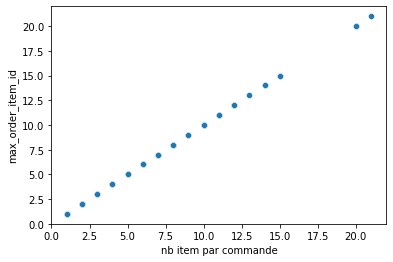

3:39: E703 statement ends with a semicolon


In [76]:
sns.scatterplot(data=prix_order_items,
                x='nb item par commande',
                y='max_order_item_id');

Les deux colonnes sont bien cohérentes. On distingue un groupe distinct de données avec un nombre beaucoup plus élevé d'item par commande.

In [77]:
df_temporaire = order_items_cleaned.groupby(by='order_id').sum()
df_temporaire = df_temporaire.drop(['order_item_id'], axis=1)

prix_order_items = prix_order_items.merge(df_temporaire, on='order_id')
prix_order_items

,nb item par commande,max_order_item_id,price,freight_value
order_id,,,,
00010242fe8c5a6d1ba2dd792cb16214,1,1,58.90,13.29
00018f77f2f0320c557190d7a144bdd3,1,1,239.90,19.93
000229ec398224ef6ca0657da4fc703e,1,1,199.00,17.87
00024acbcdf0a6daa1e931b038114c75,1,1,12.99,12.79
00042b26cf59d7ce69dfabb4e55b4fd9,1,1,199.90,18.14
...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,1,1,299.99,43.41
fffcd46ef2263f404302a634eb57f7eb,1,1,350.00,36.53
fffce4705a9662cd70adb13d4a31832d,1,1,99.90,16.95


In [78]:
prix_order_items['prix_total_order'] = prix_order_items['price'] + prix_order_items['freight_value']
prix_order_items.describe()

,nb item par commande,max_order_item_id,price,freight_value,prix_total_order
count,98656.000000,98656.000000,98656.000000,98656.000000,98656.000000
mean,1.141735,1.141735,137.755859,22.823855,160.579714
std,0.538471,0.538471,210.652198,21.651566,220.473428
min,1.000000,1.000000,0.850000,0.000000,9.590000
25%,1.000000,1.000000,45.900000,13.850000,61.980000
50%,1.000000,1.000000,86.900000,17.170000,105.290000
75%,1.000000,1.000000,149.900000,24.040000,176.870000
max,21.000000,21.000000,13440.000000,1794.960000,13664.080000


1:80: E501 line too long (100 > 79 characters)


## calcul du montant total de commande à partir du fichier payment

In [79]:
order_payment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [80]:
prix_order_payment = order_payment.groupby('order_id').sum()
prix_order_payment = prix_order_payment.drop(['payment_sequential',
                                              'payment_installments'], axis=1)
prix_order_payment.describe()

,payment_value
count,99440.000000
mean,160.990267
std,221.951257
min,0.000000
25%,62.010000
50%,105.290000
75%,176.970000
max,13664.080000


In [81]:
comparaison = prix_order_items.merge(prix_order_payment, on='order_id')
comparaison.describe()

,nb item par commande,max_order_item_id,price,freight_value,prix_total_order,payment_value
count,98655.000000,98655.000000,98655.000000,98655.000000,98655.000000,98655.000000
mean,1.141716,1.141716,137.755887,22.824000,160.579887,160.608983
std,0.538441,0.538441,210.653266,21.651628,220.474539,220.491594
min,1.000000,1.000000,0.850000,0.000000,9.590000,9.590000
25%,1.000000,1.000000,45.900000,13.850000,61.980000,62.000000
50%,1.000000,1.000000,86.900000,17.170000,105.290000,105.290000
75%,1.000000,1.000000,149.900000,24.040000,176.870000,176.880000
max,21.000000,21.000000,13440.000000,1794.960000,13664.080000,13664.080000


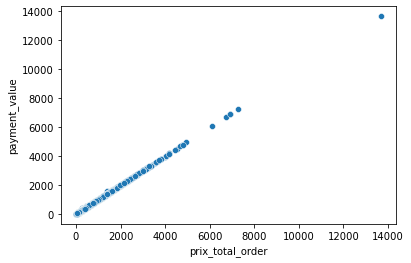

3:35: E703 statement ends with a semicolon


In [82]:
sns.scatterplot(data=comparaison,
                x='prix_total_order',
                y='payment_value');

,nb item par commande,max_order_item_id,price,freight_value,prix_total_order,payment_value,diff_values_%
count,98655.000000,98655.000000,98655.000000,98655.000000,98655.000000,98655.000000,98655.000000
mean,1.141716,1.141716,137.755887,22.824000,160.579887,160.608983,0.024783
std,0.538441,0.538441,210.653266,21.651628,220.474539,220.491594,0.547761
min,1.000000,1.000000,0.850000,0.000000,9.590000,9.590000,0.000000
25%,1.000000,1.000000,45.900000,13.850000,61.980000,62.000000,0.000000
50%,1.000000,1.000000,86.900000,17.170000,105.290000,105.290000,0.000000
75%,1.000000,1.000000,149.900000,24.040000,176.870000,176.880000,0.000000
max,21.000000,21.000000,13440.000000,1794.960000,13664.080000,13664.080000,40.929274


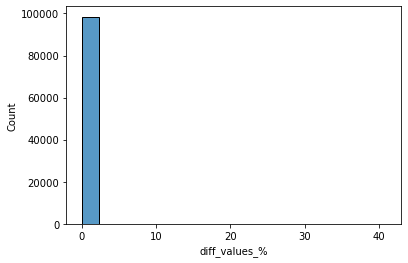

2:80: E501 line too long (101 > 79 characters)


In [83]:
comparaison['diff_values_%'] = abs(100*(comparaison['prix_total_order']
                                        - comparaison['payment_value'])/comparaison['payment_value'])
sns.histplot(comparaison, x='diff_values_%')
comparaison.describe()

In [84]:
# liste des lignes présentant des valeurs de facture différentes
# à plus de 1% par rapport au montant payé
comparaison[comparaison['diff_values_%'] > 1]

,nb item par commande,max_order_item_id,price,freight_value,prix_total_order,payment_value,diff_values_%
order_id,,,,,,,
00789ce015e7e5791c7914f32bb4fad4,1,1,154.00,14.83,168.83,190.81,11.519312
016726239765c18f66826453f39c64e3,1,1,219.99,15.14,235.13,265.77,11.528765
01e51b7c3025655646143d09b911e1d7,1,1,19.00,14.10,33.10,35.02,5.482581
028aa7c930356788f861ed1b7f984819,1,1,39.90,17.63,57.53,62.94,8.595488
02f4dd90ba0feb8ec394cac05862d2b5,1,1,79.90,51.06,130.96,141.65,7.546770
...,...,...,...,...,...,...,...
fa87437f971fce498b2184cd2401e23e,1,1,49.90,13.37,63.27,66.93,5.468400
faf132fb35b3b3b533a67efbd6e7c02d,1,1,89.90,25.12,115.02,130.01,11.529882
fbf352b18a26c6a86a53cca922facd25,2,2,109.80,41.74,151.54,160.80,5.758706


==> suppression de ces lignes où les informations ne sont pas cohérentes

In [85]:
masque = comparaison['diff_values_%'] > 1
liste_order_id = np.concatenate((liste_order_id,
                                 comparaison[masque].index))

masque = orders_cleaned['order_id'].isin(liste_order_id)
orders_cleaned = suppression_lignes(orders_cleaned, masque)

masque = order_payment['order_id'].isin(liste_order_id)
order_payment_cleaned = suppression_lignes(order_payment, masque)

masque = order_items_cleaned['order_id'].isin(liste_order_id)
order_items_cleaned = suppression_lignes(order_items_cleaned, masque)

suppression de 235 lignes, soit 0.25% des entrées.
dimension initiale : (92185, 7)
dimension finale : (91950, 7)
suppression de 3294 lignes, soit 3.17% des entrées.
dimension initiale : (103886, 5)
dimension finale : (100592, 5)
suppression de 3434 lignes, soit 3.05% des entrées.
dimension initiale : (112639, 7)
dimension finale : (109205, 7)


# Payment

In [86]:
order_payment_cleaned.describe(include='all')

,order_id,payment_sequential,payment_type,payment_installments,payment_value
count,100592,100592.000000,100592,100592.000000,100592.000000
unique,96275,NaN,5,NaN,NaN
top,fa65dad1b0e818e3ccc5cb0e39231352,NaN,credit_card,NaN,NaN
freq,29,NaN,74249,NaN,NaN
mean,NaN,1.093695,NaN,2.841260,154.298625
std,NaN,0.714856,NaN,2.675498,217.928200
min,NaN,1.000000,NaN,0.000000,0.000000
25%,NaN,1.000000,NaN,1.000000,56.840000
50%,NaN,1.000000,NaN,1.000000,100.000000
75%,NaN,1.000000,NaN,4.000000,172.100000


In [87]:
order_payment_cleaned['payment_type'].value_counts()

credit_card    74249
boleto         19259
voucher         5613
debit_card      1468
not_defined        3
Name: payment_type, dtype: int64

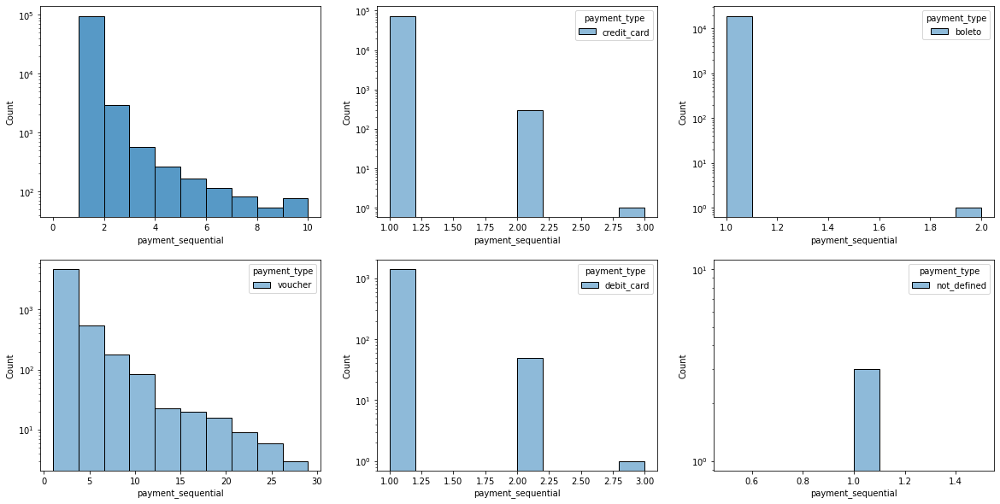

14:37: E703 statement ends with a semicolon


In [88]:
plt.figure(figsize=(20, 10))
compteur = 1
plt.subplot(2, 3, compteur)
sns.histplot(order_payment_cleaned, x='payment_sequential',
             binrange=(0, 10), bins=10, log_scale=(False, True))

for mode in order_payment_cleaned['payment_type'].unique():
    masque = order_payment_cleaned['payment_type'] == mode
    df = order_payment_cleaned[masque]
    compteur += 1
    plt.subplot(2, 3, compteur)
    sns.histplot(df, x='payment_sequential',
                 bins=10, log_scale=(False, True),
                 hue='payment_type');

Le paiement par voucher entraine un grand nombre de séquences de paiement

==> hyp : il y a une sequence de paiement par voucher. Donc une personne qui veut payer avec beaucoup de voucher se retrouve avec beaucoup de sequences de paiement

==> sous cette hypothèse, il n'y a pas d'anomalie sur cette variable

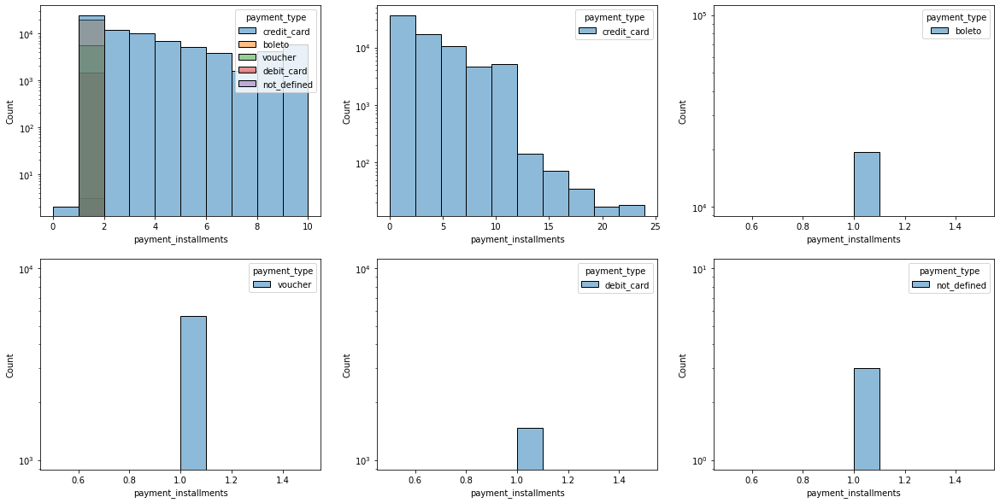

15:37: E703 statement ends with a semicolon


In [89]:
plt.figure(figsize=(20, 10))
compteur = 1
plt.subplot(2, 3, compteur)
sns.histplot(order_payment_cleaned, x='payment_installments',
             binrange=(0, 10), bins=10, log_scale=(False, True),
             hue='payment_type')

for mode in order_payment_cleaned['payment_type'].unique():
    masque = order_payment_cleaned['payment_type'] == mode
    df = order_payment_cleaned[masque]
    compteur += 1
    plt.subplot(2, 3, compteur)
    sns.histplot(df, x='payment_installments',
                 bins=10, log_scale=(False, True),
                 hue='payment_type');

Visiblement il n'est possible de fractionner son paiement que si on utilise sa carte de crédit

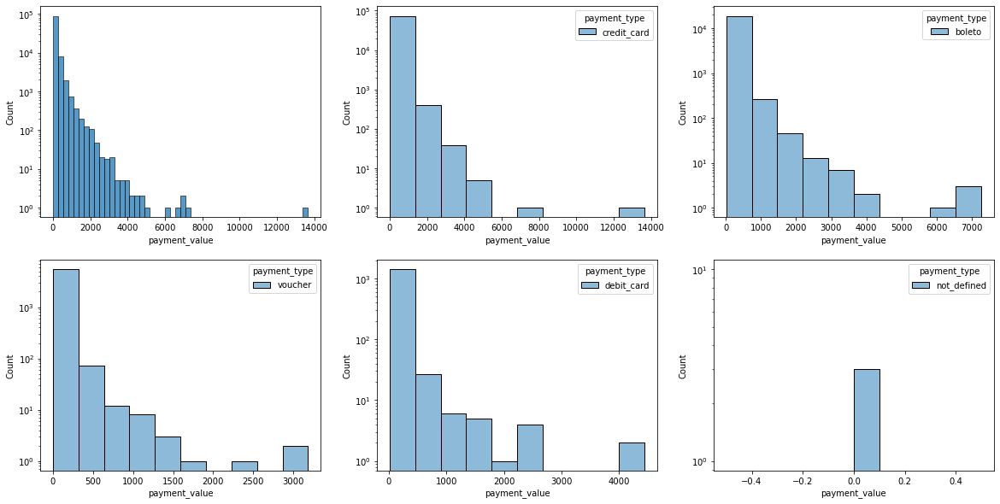

15:37: E703 statement ends with a semicolon


In [90]:
plt.figure(figsize=(20, 10))
compteur = 1
plt.subplot(2, 3, compteur)
sns.histplot(order_payment_cleaned, x='payment_value',
             log_scale=(False, True),
             bins=50)

for mode in order_payment_cleaned['payment_type'].unique():
    masque = order_payment_cleaned['payment_type'] == mode
    df = order_payment_cleaned[masque]
    compteur += 1
    plt.subplot(2, 3, compteur)
    sns.histplot(df, x='payment_value',
                 bins=10, log_scale=(False, True),
                 hue='payment_type');

Il y a des montant très élevés de commande (> 6000 R$)

In [91]:
order_payment_cleaned[order_payment_cleaned['payment_value'] > 6000]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
34370,736e1922ae60d0d6a89247b851902527,1,boleto,1,7274.88
41419,0812eb902a67711a1cb742b3cdaa65ae,1,credit_card,8,6929.31
49581,fefacc66af859508bf1a7934eab1e97f,1,boleto,1,6922.21
52107,03caa2c082116e1d31e67e9ae3700499,1,credit_card,1,13664.08
62409,2cc9089445046817a7539d90805e6e5a,1,boleto,1,6081.54
85539,f5136e38d1a14a4dbd87dff67da82701,1,boleto,1,6726.66


je garde pour l'instant ces valeurs, elles ont peut être un intéret pour la catégorisation des clients

# Saisonalité des données
identifier s'il y a un schéma lié à la saisonnalité des données
- plus d'achats en décembre ?
- période de l'année avec des creux de commande ?

In [92]:
orders_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91950 entries, 0 to 99440
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       91950 non-null  object        
 1   customer_id                    91950 non-null  object        
 2   order_purchase_timestamp       91950 non-null  datetime64[ns]
 3   order_approved_at              91950 non-null  datetime64[ns]
 4   order_delivered_carrier_date   91950 non-null  datetime64[ns]
 5   order_delivered_customer_date  91950 non-null  datetime64[ns]
 6   order_estimated_delivery_date  91950 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(2)
memory usage: 5.6+ MB


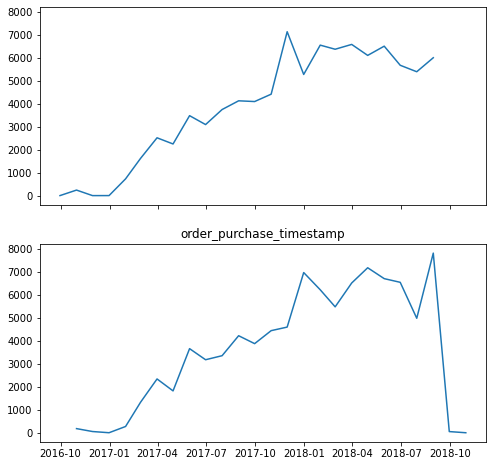

1:80: E501 line too long (98 > 79 characters)
2:80: E501 line too long (107 > 79 characters)
7:80: E501 line too long (87 > 79 characters)
7:87: E703 statement ends with a semicolon


In [93]:
saisonnalite_achat_mois = orders_cleaned.resample('M', on='order_purchase_timestamp').agg('count')
saisonnalite_livraison_mois = orders_cleaned.resample('M', on='order_delivered_customer_date').agg('count')

fig, ax = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(8, 8))
ax[0].plot(saisonnalite_achat_mois.index, saisonnalite_achat_mois['order_id'])
plt.title('order_purchase_timestamp')
ax[1].plot(saisonnalite_livraison_mois.index, saisonnalite_livraison_mois['order_id']);


Très peu de données jusqu'en janvier 2017 => suppression des données de 2016 pour se focaliser sur la période 2017-2018 où il y a plus d'activité

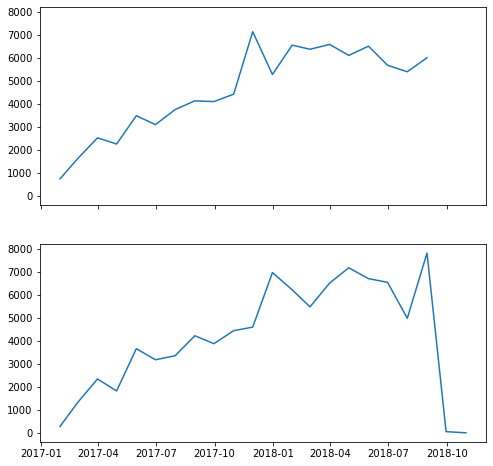

4:80: E501 line too long (106 > 79 characters)
5:80: E501 line too long (115 > 79 characters)
9:80: E501 line too long (87 > 79 characters)
9:87: E703 statement ends with a semicolon


In [94]:
masque = orders_cleaned['order_purchase_timestamp'] > '01/01/2017'
masque.sum()

saisonnalite_achat_mois = orders_cleaned[masque].resample('M', on='order_purchase_timestamp').agg('count')
saisonnalite_livraison_mois = orders_cleaned[masque].resample('M', on='order_delivered_customer_date').agg('count')

fig, ax = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(8, 8))
ax[0].plot(saisonnalite_achat_mois.index, saisonnalite_achat_mois['order_id'])
ax[1].plot(saisonnalite_livraison_mois.index, saisonnalite_livraison_mois['order_id']);

In [95]:
masque = orders_cleaned['order_purchase_timestamp'] < '01/01/2017'
orders_cleaned = suppression_lignes(orders_cleaned, masque)

suppression de 243 lignes, soit 0.26% des entrées.
dimension initiale : (91950, 7)
dimension finale : (91707, 7)


# Calcul de nouvelles features


## Regroupement des données en un seul fichier

In [96]:
data = orders_cleaned.merge(order_reviews_cleaned, on='order_id')
data = data.merge(order_items_cleaned, on='order_id')
data = data.merge(order_payment_cleaned, on='order_id')
data = data.merge(products_cleaned, on='product_id')
data = data.merge(customers, on='customer_id')
data = data.merge(sellers, on='seller_id')
# attribution des coordonnées moyennes par zipcode
data = data.merge(geolocation_mean,
                  left_on='customer_zip_code_prefix',
                  right_on='geolocation_zip_code_prefix',
                  suffixes=(None, '_customer'))
data = data.merge(geolocation_mean,
                  left_on='seller_zip_code_prefix',
                  right_on='geolocation_zip_code_prefix',
                  suffixes=(None, '_seller'))
data = data.dropna(axis=0).reset_index(drop=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100030 entries, 0 to 100029
Data columns (total 47 columns):
 #   Column                              Non-Null Count   Dtype         
---  ------                              --------------   -----         
 0   order_id                            100030 non-null  object        
 1   customer_id                         100030 non-null  object        
 2   order_purchase_timestamp            100030 non-null  datetime64[ns]
 3   order_approved_at                   100030 non-null  datetime64[ns]
 4   order_delivered_carrier_date        100030 non-null  datetime64[ns]
 5   order_delivered_customer_date       100030 non-null  datetime64[ns]
 6   order_estimated_delivery_date       100030 non-null  datetime64[ns]
 7   review_id                           100030 non-null  object        
 8   review_score                        100030 non-null  int64         
 9   review_creation_date                100030 non-null  datetime64[ns]
 10  review_a

### Cohérences de données de localisation

In [97]:
masque = data['customer_city'] != data['geolocation_city']
masque.sum()

7000

Il y a 7000 entrées qui présentent des noms de ville différents avec des zipcode identiques

==> hyp : erreur de saisie
    
==> calcul de la distance de levenshtein pour vérifier cette hypothèse

In [98]:
for i in range(data.shape[0]):
    data.loc[i, 'levenshtein_distance_customer_city-geolocation_city'] = levenshtein(data.loc[i, 'customer_city'],
                                                                                     data.loc[i, 'geolocation_city'])

2:80: E501 line too long (114 > 79 characters)
3:80: E501 line too long (117 > 79 characters)


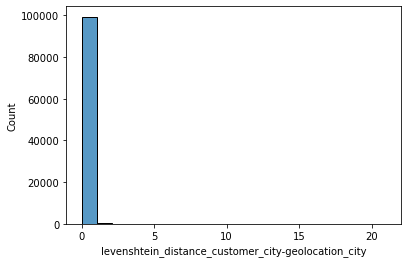

3:22: E703 statement ends with a semicolon


In [99]:
sns.histplot(data,
             x='levenshtein_distance_customer_city-geolocation_city',
             bins=20);

In [100]:
data['levenshtein_distance_customer_city-geolocation_city'].describe()

count    100030.000000
mean          0.087234
std           0.474555
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          21.000000
Name: levenshtein_distance_customer_city-geolocation_city, dtype: float64

In [101]:
masque = data['levenshtein_distance_customer_city-geolocation_city'] > 4
masque.sum()

119

In [102]:
data[masque][['customer_city', 'geolocation_city']]

,customer_city,geolocation_city
1422,rianapolis,rialma
1647,brasilia,taguatinga
2549,gaspar,luiz alves
2550,gaspar,luiz alves
2551,gaspar,luiz alves
...,...,...
92544,brasilia,gama
93443,embu,embu das artes
93444,embu,embu das artes
96930,embu,embu das artes


==> suppression des entrées où la distance de levenshtein est supérieure à 4 (ie : il faut changer plus de 4 lettres)

In [103]:
data = suppression_lignes(data, masque)

suppression de 119 lignes, soit 0.12% des entrées.
dimension initiale : (100030, 48)
dimension finale : (99911, 48)


In [104]:
data.reset_index(drop=True, inplace=True)

In [105]:
masque = data['seller_city'] != data['geolocation_city_seller']
masque.sum()

9564

Il y a 9564 entrées qui présentent des noms de ville différents avec des zipcode identiques

==> hyp : erreur de saisie

==> calcul de la distance de levenshtein pour vérifier cette hypothèse


In [106]:
for i in range(data.shape[0]):
    data.loc[i, 'levenshtein_distance_seller_city-geolocation_city'] = levenshtein(data.loc[i, 'seller_city'],
                                                                                   data.loc[i, 'geolocation_city_seller'])

2:80: E501 line too long (110 > 79 characters)
3:80: E501 line too long (122 > 79 characters)


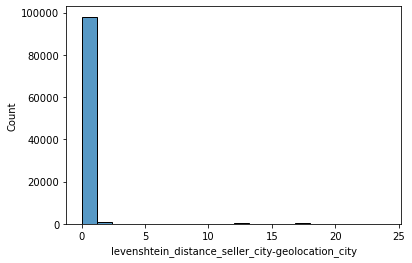

3:22: E703 statement ends with a semicolon


In [107]:
sns.histplot(data,
             x='levenshtein_distance_seller_city-geolocation_city',
             bins=20);

In [108]:
data['levenshtein_distance_seller_city-geolocation_city'].describe()

count    99911.000000
mean         0.216052
std          1.300079
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         24.000000
Name: levenshtein_distance_seller_city-geolocation_city, dtype: float64

In [109]:
masque = data['levenshtein_distance_seller_city-geolocation_city'] > 4
masque.sum()

1035

In [110]:
data[masque][['seller_city', 'geolocation_city']]

,seller_city,geolocation_city
5735,lages - sc,sinop
5749,lages - sc,apucarana
5750,lages - sc,apucarana
29220,sao paulo - sp,campinas
29221,sao paulo - sp,campinas
...,...,...
99658,rio de janeiro,campo limpo paulista
99702,barbacena/ minas gerais,salvador
99801,sp,curitiba
99884,jacarei / sao paulo,caxias do sul


==> suppression des entrées où la distance de levenshtein est supérieure à 4 (ie : il faut changer plus de 4 lettres)

In [111]:
data = suppression_lignes(data, masque)

suppression de 1035 lignes, soit 1.04% des entrées.
dimension initiale : (99911, 49)
dimension finale : (98876, 49)


In [112]:
data.reset_index(drop=True, inplace=True)

### Vérification de la suppression des order_id sélectionnés auparavant

In [113]:
masque = data['order_id'].isin(liste_order_id)
data = suppression_lignes(data, masque)

suppression de 0 lignes, soit 0.00% des entrées.
dimension initiale : (98876, 49)
dimension finale : (98876, 49)


### Corrélation des données

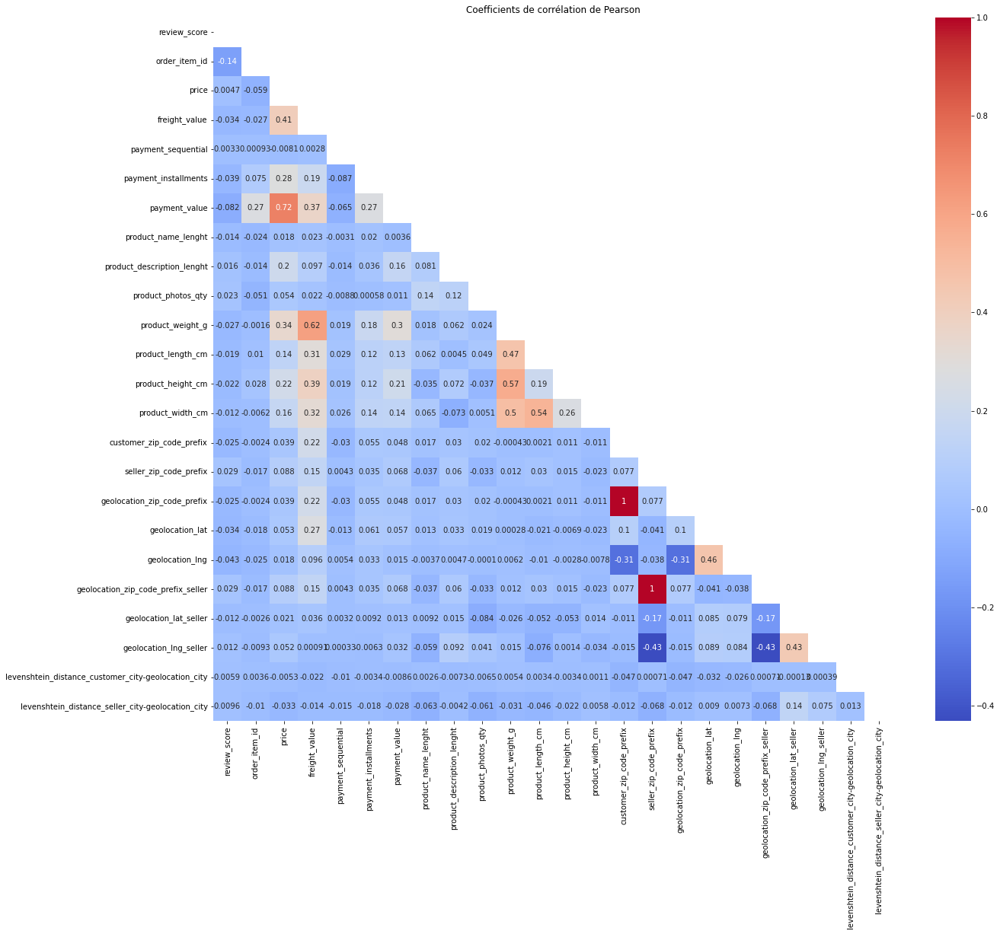

In [114]:
# calcul de la matrice de corrélation et visualisation sous forme de heatmap
corr = data.corr()
# pour masquer la partie supérieure droite de la matrice de corrélation
mask = np.triu(np.ones_like(corr, dtype=bool))

# graph
fig = plt.figure(figsize=(20, 17))
sns.heatmap(data=corr, mask=mask, annot=True, cmap='coolwarm')
plt.title("Coefficients de corrélation de Pearson")
plt.show()

In [115]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98876 entries, 0 to 98875
Data columns (total 49 columns):
 #   Column                                               Non-Null Count  Dtype         
---  ------                                               --------------  -----         
 0   order_id                                             98876 non-null  object        
 1   customer_id                                          98876 non-null  object        
 2   order_purchase_timestamp                             98876 non-null  datetime64[ns]
 3   order_approved_at                                    98876 non-null  datetime64[ns]
 4   order_delivered_carrier_date                         98876 non-null  datetime64[ns]
 5   order_delivered_customer_date                        98876 non-null  datetime64[ns]
 6   order_estimated_delivery_date                        98876 non-null  datetime64[ns]
 7   review_id                                            98876 non-null  object        
 

### Export du fichier data nettoyé
comportant uniquement les variables qui seront utilisées pour le calcul de features dans le cadre de la recherche de fréquence de maintenance

In [116]:
date = datetime.today().strftime('%Y-%m-%d_%Hh%M')

In [117]:
data_to_export = data[['customer_unique_id',
                       'payment_value',
                       'order_purchase_timestamp',
                       'review_score',
                       'order_id',
                       'order_item_id']]

In [118]:
data_to_export.to_csv('../01_DATA/data_for_maintenance_'+date+'.csv')

## RFM
Calcul pour chaque client
- R = Récence, nombre de jours entre la date de la dernière commande et la date max enregistrée dans la bdd
- F = Fréquence, nombre de commande sur une période données
- M = Montant, soit montant de la dernière commande, soit montant total sur une période donnée ou encore montant moyen sur une période donnée

In [119]:
# initialisation du fichier qui va regrouper les données pour le calcul de RFM.
client_rfm = pd.DataFrame()
client_rfm['customer_unique_id'] = data['customer_unique_id'].unique()

In [120]:
client_rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80383 entries, 0 to 80382
Data columns (total 1 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   customer_unique_id  80383 non-null  object
dtypes: object(1)
memory usage: 628.1+ KB


### Décompte du nombre de clients concernés par périodes envisagées
Tests sur différentes périodes :
- intégralité des données (3 ans)
- dernière années
- 6 derniers mois
- 3 derniers mois
- le dernier mois

In [121]:
# date la plus récente du fichier
date_max = data['order_purchase_timestamp'].max()
date_max

Timestamp('2018-08-29 15:00:37')

In [122]:
data_1_an = data[data['order_purchase_timestamp'] > '2017-08-29']
nb_consommateur = data_1_an.groupby('customer_unique_id').count().shape[0]
nb_conso_non_commande = client_rfm.shape[0] - nb_consommateur

print("il y a {} des clients (soit {:.2f}%) qui n'ont pas commandé "
      "depuis plus d'un an".format(nb_conso_non_commande,
                                   100*nb_conso_non_commande/client_rfm.shape[0]))

7:80: E501 line too long (82 > 79 characters)


il y a 18128 des clients (soit 22.55%) qui n'ont pas commandé depuis plus d'un an


In [123]:
data_6_mois = data[data['order_purchase_timestamp'] > '2018-02-28']
nb_consommateur = data_6_mois.groupby('customer_unique_id').count().shape[0]
nb_conso_non_commande = client_rfm.shape[0] - nb_consommateur
print("il y a {} des clients (soit {:.2f}%) qui n'ont pas commandé "
      "depuis plus de 6 mois".format(nb_conso_non_commande,
                                     100*nb_conso_non_commande/client_rfm.shape[0]))

6:80: E501 line too long (84 > 79 characters)


il y a 47777 des clients (soit 59.44%) qui n'ont pas commandé depuis plus de 6 mois


In [124]:
data_3_mois = data[data['order_purchase_timestamp'] > '2018-05-29']
nb_consommateur = data_3_mois.groupby('customer_unique_id').count().shape[0]
nb_conso_non_commande = client_rfm.shape[0] - nb_consommateur
print("il y a {} des clients (soit {:.2f}%) qui n'ont pas commandé "
      "depuis plus de 3 mois".format(nb_conso_non_commande,
                                     100*nb_conso_non_commande/client_rfm.shape[0]))

6:80: E501 line too long (84 > 79 characters)


il y a 64698 des clients (soit 80.49%) qui n'ont pas commandé depuis plus de 3 mois


In [125]:
data_1_mois = data[data['order_purchase_timestamp'] > '2018-07-28']
nb_consommateur = data_1_mois.groupby('customer_unique_id').count().shape[0]
nb_conso_non_commande = client_rfm.shape[0] - nb_consommateur
print("il y a {} des clients (soit {:.2f}%) qui n'ont pas commandé "
      "depuis plus d'un mois".format(nb_conso_non_commande,
                                     100*nb_conso_non_commande/client_rfm.shape[0]))

6:80: E501 line too long (84 > 79 characters)


il y a 74185 des clients (soit 92.29%) qui n'ont pas commandé depuis plus d'un mois


Comme :
- ma mission est d’aider les équipes d’Olist à comprendre les différents types d'utilisateurs. Ces catégories pourront être utilisées par l’équipe Marketing pour mieux communiquer.
- La segmentation proposée doit être exploitable et facile d’utilisation par l'équipe Marketing. Elle doit au minimum pouvoir différencier les bons et moins bons clients en termes de commandes et de satisfaction. Nous attendons bien sûr une segmentation sur l’ensemble des clients.

==> il faut un segmentation relativement récente. Afin d'avoir une vision sur suffisemment de clients je garde la période des 6 derniers mois (soit ~40% des clients disponibles dans la base de données

### Récence

In [126]:
recence = data_6_mois.groupby('customer_unique_id').max()
recence = recence['order_purchase_timestamp'].reset_index()

client_rfm = client_rfm.merge(recence, on='customer_unique_id', how='left')
client_rfm = client_rfm.rename(columns={'order_purchase_timestamp': 'Récence_6mois'})
client_rfm['Récence_6mois'] = (date_max - client_rfm['Récence_6mois']).dt.days
client_rfm.describe(include='all')

,customer_unique_id,Récence_6mois
count,80383,32606.000000
unique,80383,NaN
top,7c396fd4830fd04220f754e42b4e5bff,NaN
freq,1,NaN
mean,NaN,92.803410
std,NaN,53.201569
min,NaN,0.000000
25%,NaN,42.000000
50%,NaN,98.000000
75%,NaN,138.000000


5:80: E501 line too long (85 > 79 characters)


#### Distribution des récences

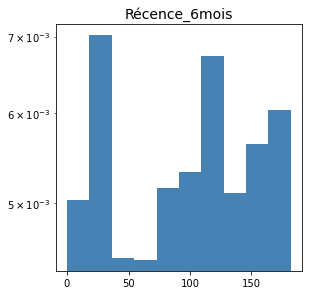

In [127]:
fig = plt.figure(figsize=(15, 10))
compteur = 1
for feat_idx in client_rfm.columns[client_rfm.columns.str.contains('Récence')]:
    ax = fig.add_subplot(2, 3, (compteur))
    h = ax.hist(client_rfm[feat_idx],
                bins=10,
                color='steelblue',
                density=True,
                edgecolor='none',
                log=True)
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

### Fréquence

Fréquence exprimée en nombre d'achat / an

#### 6 derniers mois

In [128]:
frequence = data_6_mois.groupby(['customer_unique_id',
                                 'order_id']).count().reset_index()
frequence = frequence[['customer_unique_id', 'order_id']]
frequence = frequence.groupby('customer_unique_id').count()*12/6
frequence = frequence.reset_index()

client_rfm = client_rfm.merge(frequence, on='customer_unique_id', how='left')
client_rfm = client_rfm.rename(columns={'order_id': 'Frequence_6mois'})
client_rfm.describe(include='all')

,customer_unique_id,Récence_6mois,Frequence_6mois
count,80383,32606.000000,32606.000000
unique,80383,NaN,NaN
top,7c396fd4830fd04220f754e42b4e5bff,NaN,NaN
freq,1,NaN,NaN
mean,NaN,92.803410,2.029749
std,NaN,53.201569,0.264389
min,NaN,0.000000,2.000000
25%,NaN,42.000000,2.000000
50%,NaN,98.000000,2.000000
75%,NaN,138.000000,2.000000


#### Distribution des fréquences

In [129]:
client_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80383 entries, 0 to 80382
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  80383 non-null  object 
 1   Récence_6mois       32606 non-null  float64
 2   Frequence_6mois     32606 non-null  float64
dtypes: float64(2), object(1)
memory usage: 2.5+ MB


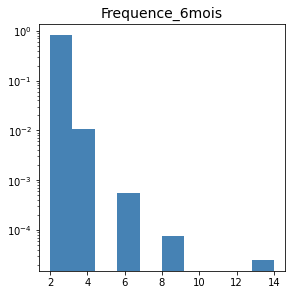

3:80: E501 line too long (81 > 79 characters)


In [130]:
fig = plt.figure(figsize=(15, 10))
compteur = 1
for feat_idx in client_rfm.columns[client_rfm.columns.str.contains('Frequence')]:
    ax = fig.add_subplot(2, 3, (compteur))
    h = ax.hist(client_rfm[feat_idx],
                bins=10,
                color='steelblue',
                density=True,
                edgecolor='none',
                log=True)
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

### Montant

Montant exprimée en R$ / an, en incluant les frais de port

In [131]:
montant = data_6_mois.groupby('customer_unique_id').sum()*12/6
montant = montant.reset_index()
montant = montant[['customer_unique_id', 'payment_value']]

client_rfm = client_rfm.merge(montant, on='customer_unique_id', how='left')
client_rfm = client_rfm.rename(columns={'payment_value': 'Montant_6mois'})
client_rfm.describe(include='all')

,customer_unique_id,Récence_6mois,Frequence_6mois,Montant_6mois
count,80383,32606.000000,32606.000000,32606.000000
unique,80383,NaN,NaN,NaN
top,7c396fd4830fd04220f754e42b4e5bff,NaN,NaN,NaN
freq,1,NaN,NaN,NaN
mean,NaN,92.803410,2.029749,430.651092
std,NaN,53.201569,0.264389,1087.462086
min,NaN,0.000000,2.000000,19.180000
25%,NaN,42.000000,2.000000,127.760000
50%,NaN,98.000000,2.000000,228.680000
75%,NaN,138.000000,2.000000,403.910000


#### Distribution des montants

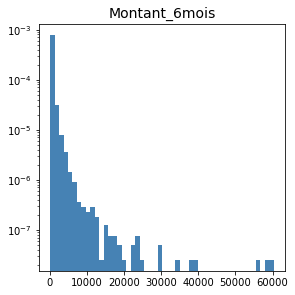

In [132]:
fig = plt.figure(figsize=(15, 10))
compteur = 1
for feat_idx in client_rfm.columns[client_rfm.columns.str.contains('Montant')]:
    ax = fig.add_subplot(2, 3, (compteur))
    h = ax.hist(client_rfm[feat_idx], bins=50,
                color='steelblue', density=True,
                edgecolor='none', log=True)
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

### Score RFM
normalisation de Récence/Fréquence/Montant et somme pour parvenir à un score ==>
- recence élevée = client qui n'a pas commandé récemment
- frequence élevée = client qui commande souvent
- montant élevé = client qui dépense plus d'argent

=> passage de la recence en négatif pour être cohérent avec les autres items

In [133]:
client_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80383 entries, 0 to 80382
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  80383 non-null  object 
 1   Récence_6mois       32606 non-null  float64
 2   Frequence_6mois     32606 non-null  float64
 3   Montant_6mois       32606 non-null  float64
dtypes: float64(3), object(1)
memory usage: 3.1+ MB


#### standardisation avec standard scaler

In [134]:
scaler = StandardScaler()
X = client_rfm.drop('customer_unique_id', axis=1)
X['Récence_6mois'] = -X['Récence_6mois']
rfm = pd.DataFrame(scaler.fit_transform(X), columns=['Recence_6mois_std',
                                                     'Frequence_6mois_std',
                                                     'Montant_6mois_std'])
rfm.describe()

,Recence_6mois_std,Frequence_6mois_std,Montant_6mois_std
count,3.260600e+04,3.260600e+04,3.260600e+04
mean,8.580513e-18,-1.092367e-14,-2.436755e-16
std,1.000015e+00,1.000015e+00,1.000015e+00
min,-1.676604e+00,-1.125219e-01,-3.783832e-01
25%,-8.495479e-01,-1.125219e-01,-2.785345e-01
50%,-9.767887e-02,-1.125219e-01,-1.857299e-01
75%,9.549378e-01,-1.125219e-01,-2.459074e-02
max,1.744400e+00,4.527581e+01,5.512125e+01


In [135]:
rfm['score_RFM_6mois'] = rfm.sum(axis=1)
rfm.describe()

,Recence_6mois_std,Frequence_6mois_std,Montant_6mois_std,score_RFM_6mois
count,3.260600e+04,3.260600e+04,3.260600e+04,8.038300e+04
mean,8.580513e-18,-1.092367e-14,-2.436755e-16,4.643634e-16
std,1.000015e+00,1.000015e+00,1.000015e+00,1.147216e+00
min,-1.676604e+00,-1.125219e-01,-3.783832e-01,-2.135728e+00
25%,-8.495479e-01,-1.125219e-01,-2.785345e-01,0.000000e+00
50%,-9.767887e-02,-1.125219e-01,-1.857299e-01,0.000000e+00
75%,9.549378e-01,-1.125219e-01,-2.459074e-02,0.000000e+00
max,1.744400e+00,4.527581e+01,5.512125e+01,7.491343e+01


In [136]:
rfm['customer_unique_id'] = client_rfm['customer_unique_id']
rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80383 entries, 0 to 80382
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Recence_6mois_std    32606 non-null  float64
 1   Frequence_6mois_std  32606 non-null  float64
 2   Montant_6mois_std    32606 non-null  float64
 3   score_RFM_6mois      80383 non-null  float64
 4   customer_unique_id   80383 non-null  object 
dtypes: float64(4), object(1)
memory usage: 3.1+ MB


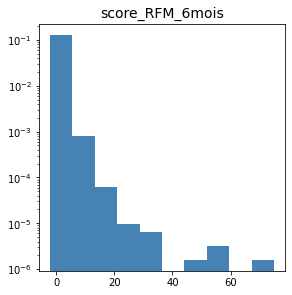

In [137]:
fig = plt.figure(figsize=(15, 10))
compteur = 1
for feat_idx in rfm.columns[rfm.columns.str.contains('RFM')]:
    ax = fig.add_subplot(2, 3, (compteur))
    h = ax.hist(rfm[feat_idx], bins=10,
                color='steelblue', density=True,
                edgecolor='none', log=True)
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

#### Standardisation avec minmax scaler
score proche de zero = client avec R, F et M bas

In [138]:
scaler = MinMaxScaler()
X = client_rfm.drop('customer_unique_id', axis=1)
X['Récence_6mois'] = -X['Récence_6mois']
rfm_minmax = pd.DataFrame(scaler.fit_transform(X), columns=['Recence_6mois_std',
                                                            'Frequence_6mois_std',
                                                            'Montant_6mois_std'])
rfm_minmax.describe()

,Recence_6mois_std,Frequence_6mois_std,Montant_6mois_std
count,32606.000000,32606.000000,32606.000000
mean,0.490091,0.002479,0.006818
std,0.292316,0.022032,0.018018
min,0.000000,0.000000,0.000000
25%,0.241758,0.000000,0.001799
50%,0.461538,0.000000,0.003471
75%,0.769231,0.000000,0.006375
max,1.000000,1.000000,1.000000


4:80: E501 line too long (80 > 79 characters)
5:80: E501 line too long (82 > 79 characters)
6:80: E501 line too long (81 > 79 characters)


In [139]:
rfm_minmax['score_RFM_minmax_6mois'] = rfm_minmax.sum(axis=1)
rfm_minmax['customer_unique_id'] = client_rfm['customer_unique_id']

rfm_minmax.describe()

,Recence_6mois_std,Frequence_6mois_std,Montant_6mois_std,score_RFM_minmax_6mois
count,32606.000000,32606.000000,32606.000000,80383.000000
mean,0.490091,0.002479,0.006818,0.202568
std,0.292316,0.022032,0.018018,0.308697
min,0.000000,0.000000,0.000000,0.000000
25%,0.241758,0.000000,0.001799,0.000000
50%,0.461538,0.000000,0.003471,0.000000
75%,0.769231,0.000000,0.006375,0.376423
max,1.000000,1.000000,1.000000,2.310036


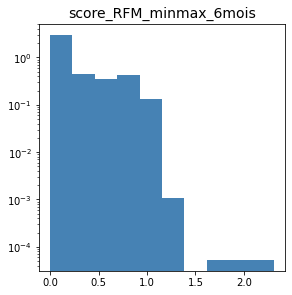

In [140]:
fig = plt.figure(figsize=(15, 10))
compteur = 1
for feat_idx in rfm_minmax.columns[rfm.columns.str.contains('RFM')]:
    ax = fig.add_subplot(2, 3, (compteur))
    h = ax.hist(rfm_minmax[feat_idx], bins=10,
                color='steelblue', density=True,
                edgecolor='none', log=True)
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

Standardisation minmax permet d'avoir un score plus facile à interpréter => je garde celui ci.

In [141]:
client_rfm = client_rfm.merge(rfm_minmax,
                              on='customer_unique_id',
                              how='left')
client_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80383 entries, 0 to 80382
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   customer_unique_id      80383 non-null  object 
 1   Récence_6mois           32606 non-null  float64
 2   Frequence_6mois         32606 non-null  float64
 3   Montant_6mois           32606 non-null  float64
 4   Recence_6mois_std       32606 non-null  float64
 5   Frequence_6mois_std     32606 non-null  float64
 6   Montant_6mois_std       32606 non-null  float64
 7   score_RFM_minmax_6mois  80383 non-null  float64
dtypes: float64(7), object(1)
memory usage: 5.5+ MB


Ce sera à comparer avec les catégorisations par clustering

## Montant moyen dépensé par client

In [142]:
# initialisation du fichier qui va regrouper toutes les variables créées par client.
client = pd.DataFrame()
client['customer_unique_id'] = data['customer_unique_id'].unique()

1:80: E501 line too long (84 > 79 characters)


In [143]:
montant = data[['customer_unique_id', 'payment_value']].groupby('customer_unique_id').mean()

client = client.merge(montant, on='customer_unique_id', how='left')
client = client.rename(columns={'payment_value': 'Montant dépensé'})
client.describe(include='all')

,customer_unique_id,Montant dépensé
count,80383,80383.000000
unique,80383,NaN
top,7c396fd4830fd04220f754e42b4e5bff,NaN
freq,1,NaN
mean,NaN,157.736542
std,NaN,214.474724
min,NaN,1.856818
25%,NaN,61.000000
50%,NaN,103.890000
75%,NaN,175.640000


1:80: E501 line too long (92 > 79 characters)


## Récence (durée depuis la dernière commande)

In [144]:
recence = data[['customer_unique_id',
                'order_purchase_timestamp']].groupby('customer_unique_id').max()

client = client.merge(recence, on='customer_unique_id', how='left')
client = client.rename(columns={'order_purchase_timestamp': 'Récence'})
client['Récence'] = (date_max - client['Récence']).dt.days
client.describe(include='all')

,customer_unique_id,Montant dépensé,Récence
count,80383,80383.000000,80383.000000
unique,80383,NaN,NaN
top,7c396fd4830fd04220f754e42b4e5bff,NaN,NaN
freq,1,NaN,NaN
mean,NaN,157.736542,239.028700
std,NaN,214.474724,151.168931
min,NaN,1.856818,0.000000
25%,NaN,61.000000,115.000000
50%,NaN,103.890000,222.000000
75%,NaN,175.640000,349.000000


2:80: E501 line too long (80 > 79 characters)


## satisfaction client
score moyen du client

In [145]:
satisfaction = data[['customer_unique_id',
                     'review_score']].groupby('customer_unique_id').mean()
satisfaction = satisfaction.rename(columns={'review_score': 'satisfaction'})
satisfaction.describe()

,satisfaction
count,80383.000000
mean,4.148036
std,1.284854
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


In [146]:
client = client.merge(satisfaction, on='customer_unique_id', how='left')

In [147]:
client.describe()

,Montant dépensé,Récence,satisfaction
count,80383.000000,80383.000000,80383.000000
mean,157.736542,239.028700,4.148036
std,214.474724,151.168931,1.284854
min,1.856818,0.000000,1.000000
25%,61.000000,115.000000,4.000000
50%,103.890000,222.000000,5.000000
75%,175.640000,349.000000,5.000000
max,13664.080000,601.000000,5.000000


## Délais de livraison moyen
Moyenne de différence entre la date de livraison et la date de commande, exprimé en jours

In [148]:
data['delais livraison'] = (data['order_delivered_customer_date'] - data['order_purchase_timestamp']).dt.days
data['delais livraison'].describe()

count    98876.000000
mean        11.972572
std          9.265977
min          0.000000
25%          6.000000
50%         10.000000
75%         15.000000
max        208.000000
Name: delais livraison, dtype: float64

1:80: E501 line too long (109 > 79 characters)


il peut exister des délais de livraison très grands

In [149]:
masque = data['delais livraison'] > 100
masque.sum()
data[masque].describe()

,review_score,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,...,seller_zip_code_prefix,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_zip_code_prefix_seller,geolocation_lat_seller,geolocation_lng_seller,levenshtein_distance_customer_city-geolocation_city,levenshtein_distance_seller_city-geolocation_city,delais livraison
count,50.000000,50.000000,50.00000,50.000000,50.000000,50.000000,50.000000,50.000000,50.00000,50.000000,...,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,2.920000,1.080000,198.83420,22.765200,1.060000,3.380000,236.448800,48.080000,696.12000,1.860000,...,30782.320000,37464.340000,-17.991200,-45.104947,30782.320000,-22.289182,-47.094928,0.020000,0.020000,143.760000
std,1.747768,0.274048,330.98215,14.973671,0.239898,3.275699,350.594413,9.631665,580.97633,1.340271,...,27893.361839,26425.663417,7.606694,4.728884,27893.361839,3.710494,2.995039,0.141421,0.141421,32.500273
min,1.000000,1.000000,14.99000,8.210000,1.000000,1.000000,13.440000,25.000000,123.00000,1.000000,...,3426.000000,1310.000000,-29.684421,-59.971237,3426.000000,-29.227431,-54.402265,0.000000,0.000000,101.000000
25%,1.000000,1.000000,60.85000,14.545000,1.000000,1.000000,74.347500,40.000000,254.75000,1.000000,...,13347.000000,14822.500000,-23.198536,-47.949643,13347.000000,-23.467977,-48.234458,0.000000,0.000000,111.250000
50%,4.000000,1.000000,113.30000,18.370000,1.000000,2.000000,125.525000,47.000000,626.50000,1.000000,...,14982.500000,27637.000000,-21.924703,-46.160873,14982.500000,-22.855787,-47.074117,0.000000,0.000000,138.000000
75%,4.750000,1.000000,178.22750,23.775000,1.000000,5.750000,230.605000,57.750000,892.50000,2.000000,...,37965.250000,57443.750000,-11.803362,-41.240829,37965.250000,-21.323547,-46.014721,0.000000,0.000000,175.000000
max,5.000000,2.000000,2029.00000,95.090000,2.000000,10.000000,2092.860000,63.000000,2987.00000,6.000000,...,95180.000000,97010.000000,-1.312191,-37.061327,95180.000000,-3.767264,-38.655667,1.000000,1.000000,208.000000


In [150]:
livraison = data[['customer_unique_id',
                  'delais livraison']].groupby('customer_unique_id').mean()
livraison.describe()

,delais livraison
count,80383.000000
mean,12.057554
std,9.353272
min,0.000000
25%,6.000000
50%,10.000000
75%,15.000000
max,208.000000


In [151]:
client = client.merge(livraison,
                      on='customer_unique_id',
                      how='left')
client.describe()

,Montant dépensé,Récence,satisfaction,delais livraison
count,80383.000000,80383.000000,80383.000000,80383.000000
mean,157.736542,239.028700,4.148036,12.057554
std,214.474724,151.168931,1.284854,9.353272
min,1.856818,0.000000,1.000000,0.000000
25%,61.000000,115.000000,4.000000,6.000000
50%,103.890000,222.000000,5.000000,10.000000
75%,175.640000,349.000000,5.000000,15.000000
max,13664.080000,601.000000,5.000000,208.000000


## nombre de commande par client

In [152]:
data_temp = data[['order_id',
                  'customer_unique_id']]
data_temp = data_temp.groupby(by=['order_id',
                                  'customer_unique_id'])
data_temp = data_temp.sum().reset_index()

nb_commandes_par_client = data_temp.groupby('order_id')
nb_commandes_par_client = nb_commandes_par_client.count()
nb_commandes_par_client = nb_commandes_par_client.reset_index()
nb_commandes_par_client = nb_commandes_par_client.drop('customer_unique_id', axis=1)
nb_commandes_par_client = nb_commandes_par_client.merge(data_temp,
                                                        on='order_id',
                                                        how='left')
nb_commandes_par_client = nb_commandes_par_client.groupby('customer_unique_id').count()
nb_commandes_par_client = nb_commandes_par_client.rename(columns={'order_id': 'nb commande par client'})
nb_commandes_par_client.describe()

,nb commande par client
count,80383.000000
mean,1.027730
std,0.190504
min,1.000000
25%,1.000000
50%,1.000000
75%,1.000000
max,14.000000


10:80: E501 line too long (84 > 79 characters)
14:80: E501 line too long (87 > 79 characters)
15:80: E501 line too long (104 > 79 characters)


In [153]:
client = client.merge(nb_commandes_par_client,
                      on='customer_unique_id', how='left')
client.describe()

,Montant dépensé,Récence,satisfaction,delais livraison,nb commande par client
count,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000
mean,157.736542,239.028700,4.148036,12.057554,1.027730
std,214.474724,151.168931,1.284854,9.353272,0.190504
min,1.856818,0.000000,1.000000,0.000000,1.000000
25%,61.000000,115.000000,4.000000,6.000000,1.000000
50%,103.890000,222.000000,5.000000,10.000000,1.000000
75%,175.640000,349.000000,5.000000,15.000000,1.000000
max,13664.080000,601.000000,5.000000,208.000000,14.000000


## Nb moyen item/commande
moyenne du nombre d'item par commande

In [154]:
# nombre total d'item par client
nb_item_tot_par_client = data[['customer_unique_id',
                               'order_item_id']]
nb_item_tot_par_client = nb_item_tot_par_client.groupby('customer_unique_id')
nb_item_tot_par_client = nb_item_tot_par_client.count()
nb_item_tot_par_client = nb_item_tot_par_client.rename(columns={'order_item_id': 'nb total item par client'})
nb_item_tot_par_client.describe()

,nb total item par client
count,80383.000000
mean,1.230061
std,0.831268
min,1.000000
25%,1.000000
50%,1.000000
75%,1.000000
max,75.000000


6:80: E501 line too long (109 > 79 characters)


In [155]:
client = client.merge(nb_item_tot_par_client,
                      on='customer_unique_id',
                      how='left')
client.describe()

,Montant dépensé,Récence,satisfaction,delais livraison,nb commande par client,nb total item par client
count,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000
mean,157.736542,239.028700,4.148036,12.057554,1.027730,1.230061
std,214.474724,151.168931,1.284854,9.353272,0.190504,0.831268
min,1.856818,0.000000,1.000000,0.000000,1.000000,1.000000
25%,61.000000,115.000000,4.000000,6.000000,1.000000,1.000000
50%,103.890000,222.000000,5.000000,10.000000,1.000000,1.000000
75%,175.640000,349.000000,5.000000,15.000000,1.000000,1.000000
max,13664.080000,601.000000,5.000000,208.000000,14.000000,75.000000


In [156]:
client['nb item par commande'] = client['nb total item par client'] / client['nb commande par client']
client.describe()

,Montant dépensé,Récence,satisfaction,delais livraison,nb commande par client,nb total item par client,nb item par commande
count,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000
mean,157.736542,239.028700,4.148036,12.057554,1.027730,1.230061,1.192619
std,214.474724,151.168931,1.284854,9.353272,0.190504,0.831268,0.714010
min,1.856818,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000
25%,61.000000,115.000000,4.000000,6.000000,1.000000,1.000000,1.000000
50%,103.890000,222.000000,5.000000,10.000000,1.000000,1.000000,1.000000
75%,175.640000,349.000000,5.000000,15.000000,1.000000,1.000000,1.000000
max,13664.080000,601.000000,5.000000,208.000000,14.000000,75.000000,38.000000


1:80: E501 line too long (102 > 79 characters)


## Type de produits commandés
Regroupement des catégories en catégories plus générales :
- meubles et electromenager
- enfants
- autre
- sport et loisirs
- santé/beauté
- habillement
- appareils electroniques
- alimentaire

In [157]:
data['product_category_traduction'].value_counts()

bed_bath_table                                   10381
health_beauty                                     8257
furniture_decor                                   7617
sports_leisure                                    7375
computers_accessories                             7080
                                                 ...  
cds_dvds_musicals                                   14
portateis_cozinha_e_preparadores_de_alimentos       13
pc_gamer                                             8
fashion_childrens_clothes                            7
security_and_services                                1
Name: product_category_traduction, Length: 73, dtype: int64

In [158]:
X = 'product_category_traduction'  # qualitative
Y = data.select_dtypes(['float64', 'int64'])  # quantitative

anova = []
features = []
for y in Y:
    anova.append(eta_squared(data[X], data[y].dropna()))
    features.append(y)

res_anova = pd.DataFrame(np.column_stack([features, anova]),
                         columns=['features', 'anova'])
res_anova.sort_values(by='anova')

,features,anova
22,levenshtein_distance_customer_city-geolocation...,0.0014509448913393097
18,geolocation_lng,0.0037865839208387855
16,geolocation_zip_code_prefix,0.006705351376479207
14,customer_zip_code_prefix,0.006705351376479207
0,review_score,0.010563466786249233
17,geolocation_lat,0.010774739656598838
4,payment_sequential,0.010814678426026068
24,delais livraison,0.02099394228415066
1,order_item_id,0.023693225332909146
5,payment_installments,0.03656728616677601


La catégorisation des produits est surtout corrélée aux variables avec un eta² > 0.1 (même si valeurs de eta² restent faibles). C'est à dire :
- product_photos_qty
- price
- product_description_lenght
- product_weight_g
- product_length_cm
- product_width_cm
- product_height_cm

Mais il y a beaucoup de catégories, voyons si en diminuant le nombre de catégories le calcul de l'anova s'améliore

In [159]:
regroupement = {
    'housewares': 'meubles et electromenager',
    'baby': 'habillement',
    'cool_stuff': 'autre',
    'garden_tools': 'outils',
    'sports_leisure': 'sport et loisirs',
    'toys': 'sport et loisirs',
    'furniture_decor': 'meubles et electromenager',
    'audio': 'meubles et electromenager',
    'health_beauty': 'santé/beauté',
    'bed_bath_table': 'meubles et electromenager',
    'auto': 'meubles et electromenager',
    'stationery': 'sport et loisirs',
    'luggage_accessories': 'sport et loisirs',
    'fashion_bags_accessories': 'habillement',
    'watches_gifts': 'habillement',
    'pet_shop': 'autre',
    'electronics': 'appareils electroniques',
    'construction_tools_construction': 'outils',
    'costruction_tools_garden': 'outils',
    'office_furniture': 'sport et loisirs',
    'furniture_living_room': 'meubles et electromenager',
    'books_general_interest': 'sport et loisirs',
    'drinks': 'alimentaire',
    'telephony': 'appareils electroniques',
    'food': 'alimentaire',
    'market_place': 'autre',
    'computers_accessories': 'appareils electroniques',
    'perfumery': 'santé/beauté',
    'air_conditioning': 'meubles et electromenager',
    'consoles_games': 'appareils electroniques',
    'costruction_tools_tools': 'outils',
    'home_appliances_2': 'meubles et electromenager',
    'fixed_telephony': 'appareils electroniques',
    'agro_industry_and_commerce': 'autre',
    'home_confort': 'meubles et electromenager',
    'small_appliances': 'meubles et electromenager',
    'kitchen_dining_laundry_garden_furniture': 'meubles et electromenager',
    'signaling_and_security': 'autre',
    'musical_instruments': 'sport et loisirs',
    'fashio_female_clothing': 'habillement',
    'fashion_shoes': 'habillement',
    'christmas_supplies': 'sport et loisirs',
    'cine_photo': 'sport et loisirs',
    'industry_commerce_and_business': 'autre',
    'construction_tools_safety': 'outils',
    'art': 'sport et loisirs',
    'construction_tools_lights': 'outils',
    'home_construction': 'outils',
    'home_appliances': 'meubles et electromenager',
    'home_comfort_2': 'meubles et electromenager',
    'furniture_bedroom': 'meubles et electromenager',
    'fashion_male_clothing': 'habillement',
    'tablets_printing_image': 'appareils electroniques',
    'flowers': 'sport et loisirs',
    'food_drink': 'alimentaire',
    'music': 'sport et loisirs',
    'furniture_mattress_and_upholstery': 'meubles et electromenager',
    'small_appliances_home_oven_and_coffee': 'meubles et electromenager',
    'books_technical': 'sport et loisirs',
    'portateis_cozinha_e_preparadores_de_alimentos': 'meubles et electromenager',
    'computers': 'appareils electroniques',
    'cds_dvds_musicals': 'sport et loisirs',
    'party_supplies': 'sport et loisirs',
    'fashion_childrens_clothes': 'habillement',
    'diapers_and_hygiene': 'santé/beauté',
    'books_imported': 'sport et loisirs',
    'pc_gamer': 'appareils electroniques',
    'dvds_blu_ray': 'sport et loisirs',
    'fashion_sport': 'habillement',
    'fashion_underwear_beach': 'habillement',
    'la_cuisine': 'alimentaire',
    'arts_and_craftmanship': 'sport et loisirs',
    'security_and_services': 'autre'
}

61:80: E501 line too long (81 > 79 characters)


In [160]:
for index in range(data.shape[0]):
    for liste_all, liste_short in regroupement.items():
        if data.loc[index, 'product_category_traduction'] == liste_all:
            data.loc[index, 'product_meta_category'] = liste_short

In [161]:
data['product_meta_category'].unique()

array(['meubles et electromenager', 'habillement', 'autre', 'outils',
       'sport et loisirs', 'santé/beauté', 'appareils electroniques',
       'alimentaire'], dtype=object)

In [162]:
data['product_meta_category'].value_counts()

meubles et electromenager    31320
sport et loisirs             17774
appareils electroniques      14817
santé/beauté                 11415
habillement                  10246
outils                        6222
autre                         6122
alimentaire                    960
Name: product_meta_category, dtype: int64

In [163]:
X = 'product_meta_category' # qualitative
Y = data.select_dtypes(['float64', 'int64']) # quantitative

anova = []
features = []
for y in Y:
    anova.append(eta_squared(data[X], data[y].dropna()))
    features.append(y)

res_anova = pd.DataFrame(np.column_stack([features, anova]),
                         columns=['features', 'anova'])
res_anova.sort_values(by='anova')

,features,anova
18,geolocation_lng,0.0011392633821379885
4,payment_sequential,0.0015671469916094672
6,payment_value,0.0018110423392076742
24,delais livraison,0.0025611885531703995
16,geolocation_zip_code_prefix,0.002749619355007679
14,customer_zip_code_prefix,0.002749619355007679
0,review_score,0.003403404671439103
17,geolocation_lat,0.005286182952819634
2,price,0.007639826716375345
1,order_item_id,0.008437110210332527


1:28: E261 at least two spaces before inline comment
2:45: E261 at least two spaces before inline comment


Avec cette nouvelle catégorisation, plus grossière, seules deux variables semblent corrélées aux catégories de produits :
- product_length_cm
- product_width_cm

ce qui correspond peu ou prou à l'encombrement d'un produit si on y rajoute product_height_cm.

il faut maintenant attribuer la valeur de catégorie majoritairement commandée par un client

In [164]:
categorie = data[['customer_unique_id',
                 'product_meta_category']]
categorie = categorie.groupby(by='customer_unique_id')
categorie = categorie.agg(lambda x: x.value_counts().index[0])
categorie = categorie.reset_index()

In [165]:
categorie

,customer_unique_id,product_meta_category
0,0000b849f77a49e4a4ce2b2a4ca5be3f,santé/beauté
1,0000f46a3911fa3c0805444483337064,sport et loisirs
2,0004aac84e0df4da2b147fca70cf8255,appareils electroniques
3,0004bd2a26a76fe21f786e4fbd80607f,outils
4,00050ab1314c0e55a6ca13cf7181fecf,appareils electroniques
...,...,...
80378,fffcf5a5ff07b0908bd4e2dbc735a684,santé/beauté
80379,fffea47cd6d3cc0a88bd621562a9d061,habillement
80380,ffff371b4d645b6ecea244b27531430a,meubles et electromenager
80381,ffff5962728ec6157033ef9805bacc48,habillement


In [166]:
client = client.merge(categorie,
                      on='customer_unique_id',
                      how='left')
client.describe(include='all')

,customer_unique_id,Montant dépensé,Récence,satisfaction,delais livraison,nb commande par client,nb total item par client,nb item par commande,product_meta_category
count,80383,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383
unique,80383,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8
top,7c396fd4830fd04220f754e42b4e5bff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,meubles et electromenager
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24009
mean,NaN,157.736542,239.028700,4.148036,12.057554,1.027730,1.230061,1.192619,NaN
std,NaN,214.474724,151.168931,1.284854,9.353272,0.190504,0.831268,0.714010,NaN
min,NaN,1.856818,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,NaN
25%,NaN,61.000000,115.000000,4.000000,6.000000,1.000000,1.000000,1.000000,NaN
50%,NaN,103.890000,222.000000,5.000000,10.000000,1.000000,1.000000,1.000000,NaN
75%,NaN,175.640000,349.000000,5.000000,15.000000,1.000000,1.000000,1.000000,NaN


## Encombrement d'un produit
=> alternative à la catégorisation des produits si nécessaire.

Ne sera pas utilisé en première intention

Calcul de l'encombrement moyen des produits commandés

encombrement = longueur * largeur * hauteur (converti en en dm^3)

In [167]:
data['encombrement_dm3'] = (data['product_length_cm'] * data['product_height_cm'] * data['product_width_cm'])/1000
data['encombrement_dm3'].describe()

count    98876.000000
mean        15.350996
std         23.295002
min          0.168000
25%          2.873000
50%          6.760000
75%         18.750000
max        294.000000
Name: encombrement_dm3, dtype: float64

1:80: E501 line too long (114 > 79 characters)


In [168]:
encombrement = data[['customer_unique_id',
                     'encombrement_dm3']].groupby('customer_unique_id').mean()
encombrement.describe()

,encombrement_dm3
count,80383.000000
mean,15.213080
std,22.987368
min,0.168000
25%,2.860000
50%,6.732000
75%,18.576000
max,294.000000


In [169]:
client = client.merge(encombrement,
                      on='customer_unique_id',
                      how='left')
client.describe()

,Montant dépensé,Récence,satisfaction,delais livraison,nb commande par client,nb total item par client,nb item par commande,encombrement_dm3
count,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000
mean,157.736542,239.028700,4.148036,12.057554,1.027730,1.230061,1.192619,15.213080
std,214.474724,151.168931,1.284854,9.353272,0.190504,0.831268,0.714010,22.987368
min,1.856818,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.168000
25%,61.000000,115.000000,4.000000,6.000000,1.000000,1.000000,1.000000,2.860000
50%,103.890000,222.000000,5.000000,10.000000,1.000000,1.000000,1.000000,6.732000
75%,175.640000,349.000000,5.000000,15.000000,1.000000,1.000000,1.000000,18.576000
max,13664.080000,601.000000,5.000000,208.000000,14.000000,75.000000,38.000000,294.000000


# EDA fichier client

In [171]:
client.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80383 entries, 0 to 80382
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_unique_id        80383 non-null  object 
 1   Montant dépensé           80383 non-null  float64
 2   Récence                   80383 non-null  int64  
 3   satisfaction              80383 non-null  float64
 4   delais livraison          80383 non-null  float64
 5   nb commande par client    80383 non-null  int64  
 6   nb total item par client  80383 non-null  int64  
 7   nb item par commande      80383 non-null  float64
 8   product_meta_category     80383 non-null  object 
 9   encombrement_dm3          80383 non-null  float64
dtypes: float64(5), int64(3), object(2)
memory usage: 6.7+ MB


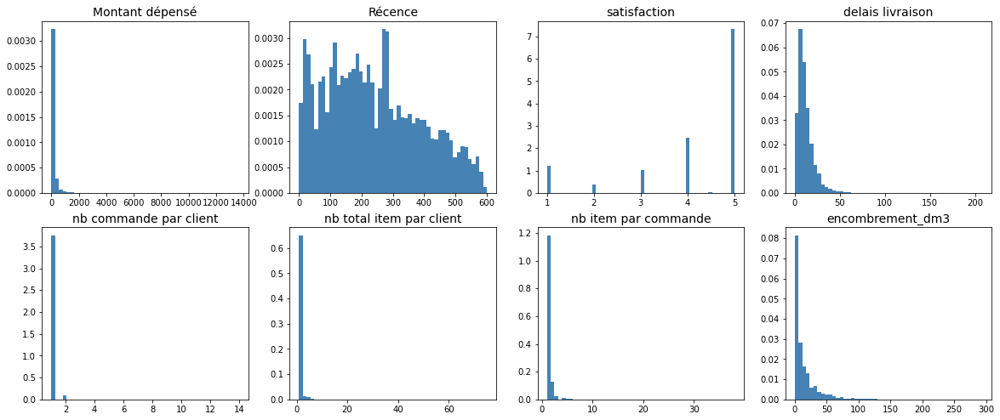

In [172]:
fig = plt.figure(figsize=(20, 35))
compteur = 1
for feat_idx in client.select_dtypes(['float64', 'int64']):
    ax = fig.add_subplot(8, 4, (compteur))
    h = ax.hist(client[feat_idx], bins=50,
                color='steelblue', density=True,
                edgecolor='none')
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

In [173]:
client.describe()

,Montant dépensé,Récence,satisfaction,delais livraison,nb commande par client,nb total item par client,nb item par commande,encombrement_dm3
count,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000,80383.000000
mean,157.736542,239.028700,4.148036,12.057554,1.027730,1.230061,1.192619,15.213080
std,214.474724,151.168931,1.284854,9.353272,0.190504,0.831268,0.714010,22.987368
min,1.856818,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.168000
25%,61.000000,115.000000,4.000000,6.000000,1.000000,1.000000,1.000000,2.860000
50%,103.890000,222.000000,5.000000,10.000000,1.000000,1.000000,1.000000,6.732000
75%,175.640000,349.000000,5.000000,15.000000,1.000000,1.000000,1.000000,18.576000
max,13664.080000,601.000000,5.000000,208.000000,14.000000,75.000000,38.000000,294.000000


Il y a visiblement des outliers (clients qui commandent bcp / dépensent bcp plus que les autres)

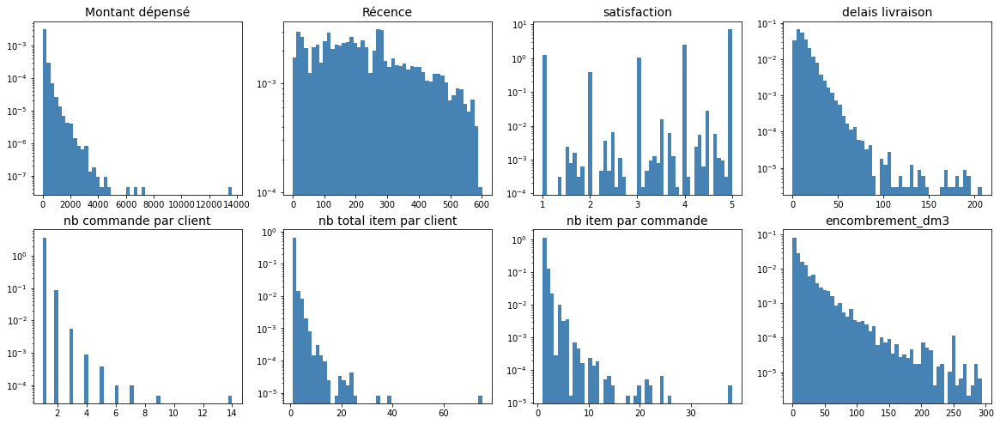

In [174]:
fig = plt.figure(figsize=(20, 35))
compteur = 1
for feat_idx in client.select_dtypes(['float64', 'int64']):
    ax = fig.add_subplot(8, 4, (compteur))
    h = ax.hist(client[feat_idx], bins=50,
                color='steelblue', density=True,
                edgecolor='none', log=True)
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

## Export fichier avant nettoyage

In [175]:
date = datetime.today().strftime('%Y-%m-%d_%Hh%M')

In [176]:
client.to_csv('../01_DATA/data_for_modeling_no_cleaning'+date+'.csv')

## Montant dépensé

In [177]:
masque = client['Montant dépensé'] > 5000
masque.sum()

4

In [178]:
# suppression des clients qui ont dépensé en moyenne plus de 5000R$
client_cleaned = suppression_lignes(client, masque)

suppression de 4 lignes, soit 0.00% des entrées.
dimension initiale : (80383, 10)
dimension finale : (80379, 10)


## Nombre de commande moyen par client

In [179]:
masque = client_cleaned['nb commande par client'] > 1
print("client ayant passé plus d'1 commande : {}, "
      "soit {:.2f}%".format(masque.sum(),
                            100*masque.sum()/client_cleaned.shape[0]))

client ayant passé plus d'1 commande : 2015, soit 2.51%


In [180]:
masque = client_cleaned['nb commande par client'] > 5
masque.sum()

6

In [181]:
# suppression des clients qui ont commandé plus de 5 fois
client_cleaned = suppression_lignes(client_cleaned, masque)

suppression de 6 lignes, soit 0.01% des entrées.
dimension initiale : (80379, 10)
dimension finale : (80373, 10)


## Nombre total d'item par commande

In [182]:
masque = client_cleaned['nb item par commande'] > 1
print("client ayant commandé plus d'1 item par commande : {}, "
      "soit {:.2f}%".format(masque.sum(),
                            100*masque.sum()/client_cleaned.shape[0]))

client ayant commandé plus d'1 item par commande : 10551, soit 13.13%


In [183]:
masque = client_cleaned['nb item par commande'] > 15
masque.sum()

16

In [184]:
# suppression des clients qui ont commandé plus de 15 articles par commande en moyenne
client_cleaned = suppression_lignes(client_cleaned, masque)

1:80: E501 line too long (86 > 79 characters)


suppression de 16 lignes, soit 0.02% des entrées.
dimension initiale : (80373, 10)
dimension finale : (80357, 10)


## nombre d'item par client

In [185]:
masque = client_cleaned['nb total item par client'] > 1
print("client ayant commandé plus d'1 item en tout : {}, "
      "soit {:.2f}%".format(masque.sum(),
                            100*masque.sum()/client_cleaned.shape[0]))

client ayant commandé plus d'1 item en tout : 11872, soit 14.77%


In [186]:
masque = client_cleaned['nb total item par client'] > 15
masque.sum()

3

In [187]:
# suppression des clients qui ont commandé plus de 15 articles par commande
client_cleaned = suppression_lignes(client_cleaned, masque)

suppression de 3 lignes, soit 0.00% des entrées.
dimension initiale : (80357, 10)
dimension finale : (80354, 10)


## Encombrement

In [188]:
masque = client_cleaned['encombrement_dm3'] > 250
masque.sum()

77

In [189]:
# suppression des clients qui ont commandé des articles présentant un encombrement moyen de plus de 200cm
client_cleaned = suppression_lignes(client_cleaned, masque)

1:80: E501 line too long (105 > 79 characters)


suppression de 77 lignes, soit 0.10% des entrées.
dimension initiale : (80354, 10)
dimension finale : (80277, 10)


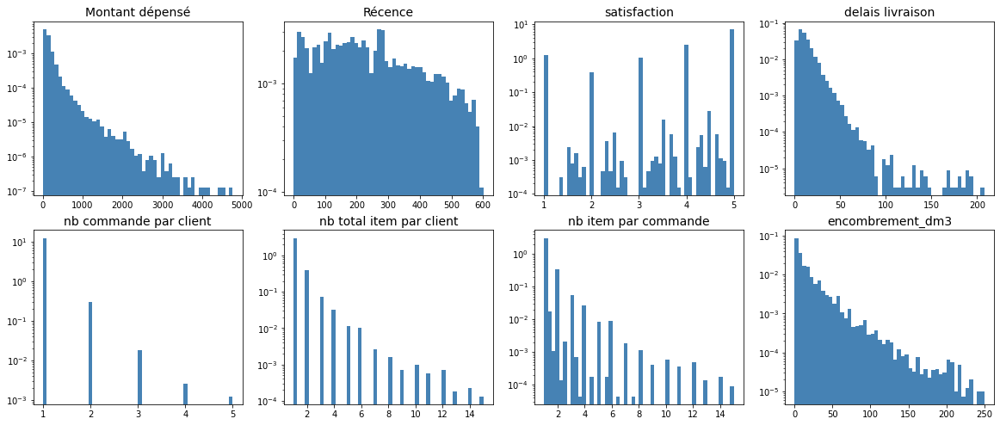

In [190]:
fig = plt.figure(figsize=(20, 35))
compteur = 1
for feat_idx in client_cleaned.select_dtypes(['float64', 'int64']):
    ax = fig.add_subplot(8, 4, (compteur))
    h = ax.hist(client_cleaned[feat_idx], bins=50,
                color='steelblue', density=True,
                edgecolor='none', log=True)
    ax.set_title(feat_idx, fontsize=14)
    compteur += 1

In [191]:
client_cleaned.describe()

,Montant dépensé,Récence,satisfaction,delais livraison,nb commande par client,nb total item par client,nb item par commande,encombrement_dm3
count,80277.000000,80277.000000,80277.000000,80277.000000,80277.000000,80277.000000,80277.000000,80277.000000
mean,156.543060,238.946224,4.148540,12.050080,1.027144,1.223339,1.187681,14.978904
std,202.893502,151.131415,1.284323,9.344919,0.178293,0.706303,0.631553,21.707691
min,3.166667,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.168000
25%,60.960000,115.000000,4.000000,6.000000,1.000000,1.000000,1.000000,2.856000
50%,103.790000,222.000000,5.000000,10.000000,1.000000,1.000000,1.000000,6.720000
75%,175.280000,349.000000,5.000000,15.000000,1.000000,1.000000,1.000000,18.513000
max,4764.340000,601.000000,5.000000,208.000000,5.000000,15.000000,15.000000,250.000000


## Corrélations entre variables
### quantitatives

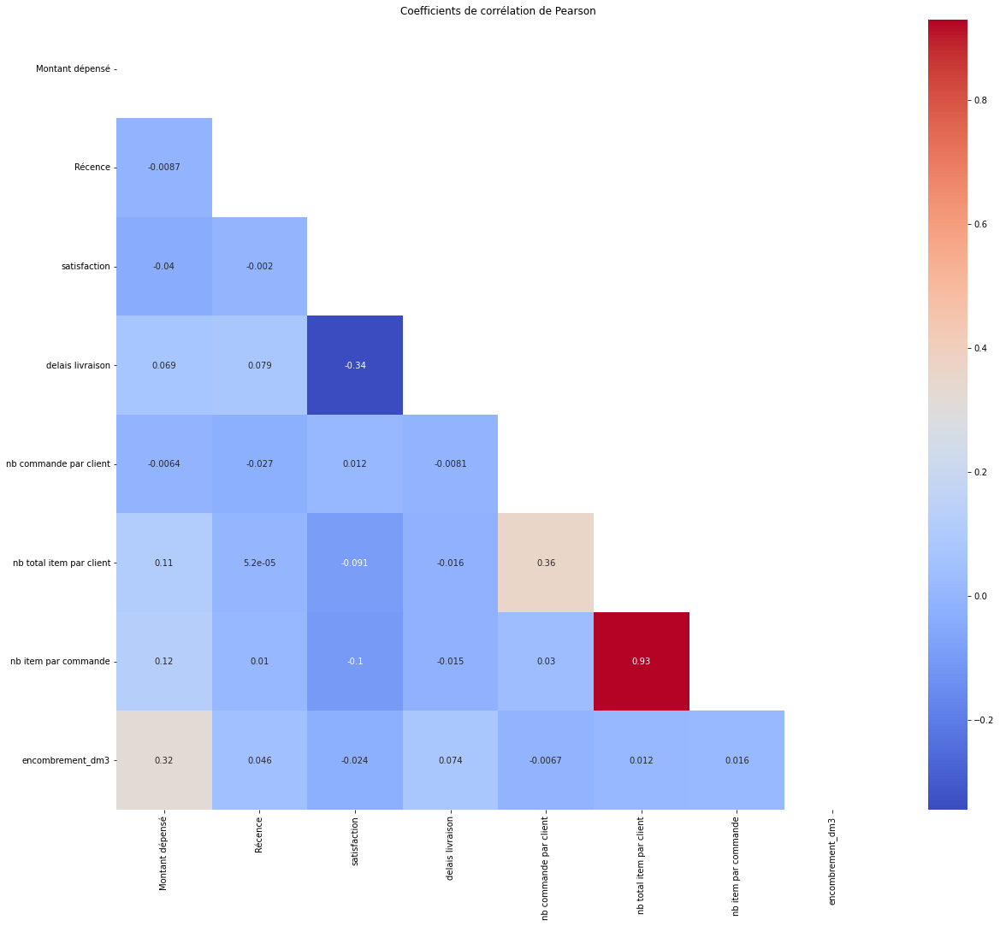

In [192]:
# calcul de la matrice de corrélation et visualisation sous forme de heatmap
corr = client_cleaned.corr()
# pour masquer la partie supérieure droite de la matrice de corrélation
mask = np.triu(np.ones_like(corr, dtype=bool))

# graph
fig = plt.figure(figsize=(20, 17))
sns.heatmap(data=corr, mask=mask, annot=True,  cmap='coolwarm')
plt.title("Coefficients de corrélation de Pearson")
plt.show()

Les variables nb total item par client et nb item par commande sont fortement corrélées (par construction)
=> il faudra supprimer une des deux du jeu de données

### Variance données quantitatives

In [193]:
pd.DataFrame(client_cleaned.var(), columns=['Variance']).sort_values(by='Variance')

C:\Users\Helene\AppData\Local\Temp/ipykernel_35828/3638744486.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  pd.DataFrame(client_cleaned.var(), columns=['Variance']).sort_values(by='Variance')


,Variance
nb commande par client,0.031789
nb item par commande,0.398859
nb total item par client,0.498863
satisfaction,1.649486
delais livraison,87.327509
encombrement_dm3,471.223832
Récence,22840.704480
Montant dépensé,41165.772995


1:80: E501 line too long (83 > 79 characters)


## données catégorielles

In [194]:
X = 'product_meta_category'  # qualitative
Y = client_cleaned.select_dtypes(['float64', 'int64'])  # quantitative

anova = []
features = []
for y in Y:
    anova.append(eta_squared(client_cleaned[X], client_cleaned[y].dropna()))
    features.append(y)

res_anova = pd.DataFrame(np.column_stack([features, anova]),
                         columns=['features', 'anova'])
res_anova.sort_values(by='anova')

,features,anova
4,nb commande par client,0.0010299096145943668
3,delais livraison,0.002035641967230564
2,satisfaction,0.002610043883563134
0,Montant dépensé,0.00565937616392853
1,Récence,0.005773711855343683
6,nb item par commande,0.007650398261771303
5,nb total item par client,0.00769010651712467
7,encombrement_dm3,0.10042276293977864


La variable 'encombrement' est la seule corrélée à 'product_meta_category'.

==> il ne faudra utiliser qu'une des deux variable dans les modélisations

# Finalisation du fichier client

In [195]:
client_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80277 entries, 0 to 80382
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_unique_id        80277 non-null  object 
 1   Montant dépensé           80277 non-null  float64
 2   Récence                   80277 non-null  int64  
 3   satisfaction              80277 non-null  float64
 4   delais livraison          80277 non-null  float64
 5   nb commande par client    80277 non-null  int64  
 6   nb total item par client  80277 non-null  int64  
 7   nb item par commande      80277 non-null  float64
 8   product_meta_category     80277 non-null  object 
 9   encombrement_dm3          80277 non-null  float64
dtypes: float64(5), int64(3), object(2)
memory usage: 6.7+ MB


In [196]:
liste_colonnes_supp = ['nb total item par client']
liste_colonnes_supp_client = []

client_cleaned, liste_colonnes_supp_client = suppression_colonnes(client_cleaned,
                                                                  liste_colonnes_supp,
                                                                  liste_colonnes_supp_client)

4:80: E501 line too long (81 > 79 characters)
5:80: E501 line too long (86 > 79 characters)
6:80: E501 line too long (93 > 79 characters)


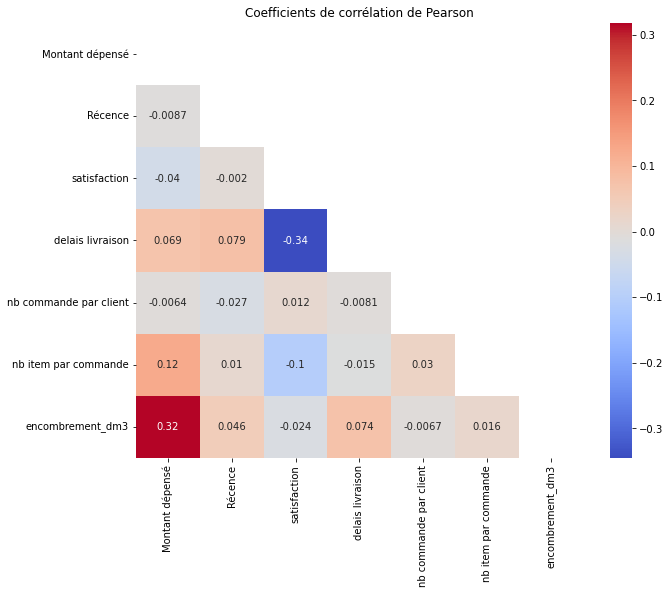

In [197]:
# calcul de la matrice de corrélation et visualisation sous forme de heatmap
corr = client_cleaned.corr()
# pour masquer la partie supérieure droite de la matrice de corrélation
mask = np.triu(np.ones_like(corr, dtype=bool))

# graph
fig = plt.figure(figsize=(10, 8))
sns.heatmap(data=corr, mask=mask, annot=True,  cmap='coolwarm')
plt.title("Coefficients de corrélation de Pearson")
plt.show()

In [198]:
X = 'product_meta_category'  # qualitative
Y = client_cleaned.select_dtypes(['float64', 'int64'])  # quantitative

anova = []
features = []
for y in Y:
    anova.append(eta_squared(client[X], client[y].dropna()))
    features.append(y)

res_anova = pd.DataFrame(np.column_stack([features, anova]),
                         columns=['features', 'anova'])
res_anova.sort_values(by='anova')

,features,anova
4,nb commande par client,0.0010303987872566462
3,delais livraison,0.0019641923517473192
2,satisfaction,0.002616486558821214
0,Montant dépensé,0.004962779623052759
1,Récence,0.005721107372996882
5,nb item par commande,0.0061638486055954214
6,encombrement_dm3,0.08778187048501587


# Export des données

In [199]:
date = datetime.today().strftime('%Y-%m-%d_%Hh%M')

In [200]:
client_cleaned.to_csv('../01_DATA/data_for_modeling_'+date+'.csv')

In [201]:
Affichage_duree(start_time_ALL)

Temps d'exécution : 9.79min


587.5605294000001